In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

In [4]:
# ============================================================
# CELL 1 — FULL SETUP + DATASET LOAD
# EfficientNetV2 | Betel Leaf Disease Classification
# Kaggle
# ============================================================

import os
import random
import numpy as np
import tensorflow as tf

from tensorflow.keras import layers, models
from tensorflow.keras import mixed_precision

# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("=" * 65)
print("EfficientNetV2 — Betel Leaf Disease Classification")
print("=" * 65)

print("TensorFlow Version :", tf.__version__)
print("GPU Available      :", tf.config.list_physical_devices("GPU"))

# ============================================================
# 2. MIXED PRECISION
# ============================================================

mixed_precision.set_global_policy("mixed_float16")

print("\nMixed Precision Policy:")
print(mixed_precision.global_policy())

# ============================================================
# 3. DATASET PATH
# Exact path used in previous DenseNet121 experiment
# ============================================================

DATASET_PATH = (
    "/kaggle/input/datasets/"
    "efrathhossainshihab/"
    "betel-leaf-dataset-split/"
    "Betel_Leaf_DataSet_Split"
)

TRAIN_DIR = os.path.join(
    DATASET_PATH,
    "train_augmented_1100"
)

VAL_DIR = os.path.join(
    DATASET_PATH,
    "validation"
)

TEST_DIR = os.path.join(
    DATASET_PATH,
    "test"
)

print("\n" + "=" * 65)
print("DATASET PATHS")
print("=" * 65)

print("TRAIN      :", TRAIN_DIR)
print("VALIDATION :", VAL_DIR)
print("TEST       :", TEST_DIR)

# ============================================================
# 4. PATH CHECK
# ============================================================

train_exists = os.path.exists(TRAIN_DIR)
val_exists   = os.path.exists(VAL_DIR)
test_exists  = os.path.exists(TEST_DIR)

print("\nExistence Check:")
print("Train      :", train_exists)
print("Validation :", val_exists)
print("Test       :", test_exists)

if not all([
    train_exists,
    val_exists,
    test_exists
]):
    print("\n❌ Dataset folders not found.")
    print("\nAvailable Kaggle Inputs:\n")

    for root, dirs, files in os.walk("/kaggle/input"):
        level = root.replace("/kaggle/input", "").count(os.sep)

        if level <= 5:
            indent = "    " * level
            print(indent + "📁 " + os.path.basename(root))

    raise FileNotFoundError(
        "\nDataset path does not exist in this Kaggle session.\n"
        "Attach the same Betel Leaf dataset used for DenseNet121."
    )

print("\n✅ Dataset path verified successfully.")

# ============================================================
# 5. TRAINING SETTINGS
# Same settings used for DenseNet121
# ============================================================

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

print("\n" + "=" * 65)
print("TRAINING CONFIGURATION")
print("=" * 65)

print("Image Size :", IMG_SIZE)
print("Batch Size :", BATCH_SIZE)
print("Seed       :", SEED)

# ============================================================
# 6. IMAGE COUNT FUNCTION
# ============================================================

VALID_EXTENSIONS = (
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
)

def count_images(folder):

    total = 0
    class_counts = {}

    for class_name in sorted(os.listdir(folder)):

        class_path = os.path.join(
            folder,
            class_name
        )

        if os.path.isdir(class_path):

            count = sum(
                1
                for filename in os.listdir(class_path)
                if filename.lower().endswith(
                    VALID_EXTENSIONS
                )
            )

            class_counts[class_name] = count
            total += count

    return class_counts, total


# ============================================================
# 7. DATASET STATISTICS
# ============================================================

print("\n" + "=" * 65)
print("TRAIN DATASET")
print("=" * 65)

train_counts, train_total = count_images(
    TRAIN_DIR
)

for class_name, count in train_counts.items():
    print(f"{class_name:<20}: {count}")

print("-" * 35)
print("Total:", train_total)


print("\n" + "=" * 65)
print("VALIDATION DATASET")
print("=" * 65)

val_counts, val_total = count_images(
    VAL_DIR
)

for class_name, count in val_counts.items():
    print(f"{class_name:<20}: {count}")

print("-" * 35)
print("Total:", val_total)


print("\n" + "=" * 65)
print("TEST DATASET")
print("=" * 65)

test_counts, test_total = count_images(
    TEST_DIR
)

for class_name, count in test_counts.items():
    print(f"{class_name:<20}: {count}")

print("-" * 35)
print("Total:", test_total)

# ============================================================
# 8. LOAD TRAIN DATASET
# ============================================================

train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=True,
    seed=SEED
)

# ============================================================
# 9. LOAD VALIDATION DATASET
# ============================================================

val_ds = tf.keras.utils.image_dataset_from_directory(
    VAL_DIR,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=False
)

# ============================================================
# 10. LOAD TEST DATASET
# ============================================================

test_ds = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=False
)

# ============================================================
# 11. CLASS INFORMATION
# ============================================================

class_names = train_ds.class_names
NUM_CLASSES = len(class_names)

print("\n" + "=" * 65)
print("CLASS INFORMATION")
print("=" * 65)

print("Class Names       :", class_names)
print("Number of Classes :", NUM_CLASSES)

# ============================================================
# 12. PREFETCH FOR GPU PERFORMANCE
# ============================================================

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(
    AUTOTUNE
)

val_ds = val_ds.prefetch(
    AUTOTUNE
)

test_ds = test_ds.prefetch(
    AUTOTUNE
)

# ============================================================
# 13. VERIFY ONE BATCH
# ============================================================

for images, labels in train_ds.take(1):

    print("\n" + "=" * 65)
    print("BATCH CHECK")
    print("=" * 65)

    print("Image Shape :", images.shape)
    print("Label Shape :", labels.shape)
    print("Image dtype :", images.dtype)
    print("Label dtype :", labels.dtype)

# ============================================================
# 14. CREATE RESULT DIRECTORY
# ============================================================

RESULT_DIR = "/kaggle/working/EfficientNetV2"

os.makedirs(
    RESULT_DIR,
    exist_ok=True
)

print("\nResult Directory:")
print(RESULT_DIR)

# ============================================================
# FINAL STATUS
# ============================================================

print("\n" + "=" * 65)
print("✅ CELL 1 COMPLETED SUCCESSFULLY")
print("=" * 65)

print(f"Train Images      : {train_total}")
print(f"Validation Images : {val_total}")
print(f"Test Images       : {test_total}")

print(f"Classes           : {NUM_CLASSES}")
print(f"Class Names       : {class_names}")

print(f"Image Size        : {IMG_SIZE}")
print(f"Batch Size        : {BATCH_SIZE}")

print("\n🚀 Dataset is ready for EfficientNetV2 training.")

EfficientNetV2 — Betel Leaf Disease Classification
TensorFlow Version : 2.20.0
GPU Available      : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]

Mixed Precision Policy:
<DTypePolicy "mixed_float16">

DATASET PATHS
TRAIN      : /kaggle/input/datasets/efrathhossainshihab/betel-leaf-dataset-split/Betel_Leaf_DataSet_Split/train_augmented_1100
VALIDATION : /kaggle/input/datasets/efrathhossainshihab/betel-leaf-dataset-split/Betel_Leaf_DataSet_Split/validation
TEST       : /kaggle/input/datasets/efrathhossainshihab/betel-leaf-dataset-split/Betel_Leaf_DataSet_Split/test

Existence Check:
Train      : True
Validation : True
Test       : True

✅ Dataset path verified successfully.

TRAINING CONFIGURATION
Image Size : (224, 224)
Batch Size : 32
Seed       : 42

TRAIN DATASET
Anthracnose         : 1100
Healthy             : 1100
Leaf_Curl           : 1100
Leaf_Rot            : 1100
Leaf_Spot           : 1100
-

I0000 00:00:1788116612.663146      58 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1788116612.669618      58 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 685 files belonging to 5 classes.
Found 685 files belonging to 5 classes.

CLASS INFORMATION
Class Names       : ['Anthracnose', 'Healthy', 'Leaf_Curl', 'Leaf_Rot', 'Leaf_Spot']
Number of Classes : 5

BATCH CHECK
Image Shape : (32, 224, 224, 3)
Label Shape : (32, 5)
Image dtype : <dtype: 'float32'>
Label dtype : <dtype: 'float32'>

Result Directory:
/kaggle/working/EfficientNetV2

✅ CELL 1 COMPLETED SUCCESSFULLY
Train Images      : 5500
Validation Images : 685
Test Images       : 685
Classes           : 5
Class Names       : ['Anthracnose', 'Healthy', 'Leaf_Curl', 'Leaf_Rot', 'Leaf_Spot']
Image Size        : (224, 224)
Batch Size        : 32

🚀 Dataset is ready for EfficientNetV2 training.


In [5]:
# ============================================================
# CELL 2 — EfficientNetV2B0 MODEL + STAGE 1 TRAINING
# Frozen Backbone Transfer Learning
# ============================================================

import os
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.callbacks import (
    ModelCheckpoint,
    EarlyStopping,
    ReduceLROnPlateau,
    CSVLogger
)

# ============================================================
# 1. PATHS
# ============================================================

STAGE1_MODEL_PATH = os.path.join(
    RESULT_DIR,
    "efficientnetv2_stage1_best.keras"
)

STAGE1_LOG_PATH = os.path.join(
    RESULT_DIR,
    "efficientnetv2_stage1_log.csv"
)

# ============================================================
# 2. EFFICIENTNETV2 BACKBONE
# ============================================================

base_model = EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3),
    include_preprocessing=True
)

# Freeze whole backbone for Stage 1
base_model.trainable = False

print("=" * 70)
print("EfficientNetV2B0 BACKBONE LOADED")
print("=" * 70)

print("Backbone Trainable:", base_model.trainable)
print("Backbone Layers   :", len(base_model.layers))

# ============================================================
# 3. CLASSIFICATION MODEL
# ============================================================

inputs = layers.Input(
    shape=(224, 224, 3),
    name="input_image"
)

x = base_model(
    inputs,
    training=False
)

x = layers.GlobalAveragePooling2D(
    name="global_average_pooling"
)(x)

x = layers.BatchNormalization(
    name="classifier_batchnorm"
)(x)

x = layers.Dropout(
    0.35,
    name="dropout_1"
)(x)

x = layers.Dense(
    256,
    activation="relu",
    name="dense_256"
)(x)

x = layers.Dropout(
    0.25,
    name="dropout_2"
)(x)

# float32 output is important when mixed precision is enabled
outputs = layers.Dense(
    NUM_CLASSES,
    activation="softmax",
    dtype="float32",
    name="predictions"
)(x)

model = models.Model(
    inputs,
    outputs,
    name="EfficientNetV2B0_BetelLeaf"
)

# ============================================================
# 4. COMPILE
# ============================================================

STAGE1_LR = 1e-3

model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=STAGE1_LR
    ),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# ============================================================
# 5. MODEL SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("MODEL SUMMARY")
print("=" * 70)

model.summary()

print("\nTotal Parameters     :", model.count_params())

trainable_params = sum(
    tf.keras.backend.count_params(w)
    for w in model.trainable_weights
)

non_trainable_params = sum(
    tf.keras.backend.count_params(w)
    for w in model.non_trainable_weights
)

print("Trainable Parameters :", trainable_params)
print("Frozen Parameters    :", non_trainable_params)

# ============================================================
# 6. CALLBACKS
# ============================================================

stage1_callbacks = [

    ModelCheckpoint(
        filepath=STAGE1_MODEL_PATH,
        monitor="val_accuracy",
        save_best_only=True,
        mode="max",
        verbose=1
    ),

    EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),

    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=2,
        min_lr=1e-7,
        verbose=1
    ),

    CSVLogger(
        STAGE1_LOG_PATH
    )
]

# ============================================================
# 7. STAGE 1 TRAINING
# ============================================================

STAGE1_EPOCHS = 12

print("\n" + "=" * 70)
print("STAGE 1 TRAINING STARTING")
print("=" * 70)

print("Model           : EfficientNetV2B0")
print("Backbone        : Frozen")
print("Epochs          :", STAGE1_EPOCHS)
print("Learning Rate   :", STAGE1_LR)
print("Image Size      :", IMG_SIZE)
print("Batch Size      :", BATCH_SIZE)

history_stage1 = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=STAGE1_EPOCHS,
    callbacks=stage1_callbacks,
    verbose=1
)

# ============================================================
# 8. LOAD BEST STAGE 1 MODEL
# ============================================================

model = tf.keras.models.load_model(
    STAGE1_MODEL_PATH
)

# ============================================================
# 9. STAGE 1 VALIDATION RESULT
# ============================================================

stage1_val_loss, stage1_val_acc = model.evaluate(
    val_ds,
    verbose=1
)

print("\n" + "=" * 70)
print("✅ STAGE 1 COMPLETE")
print("=" * 70)

print(
    f"Best Validation Accuracy : "
    f"{stage1_val_acc * 100:.2f}%"
)

print(
    f"Validation Loss          : "
    f"{stage1_val_loss:.4f}"
)

print("\nSaved Best Model:")
print(STAGE1_MODEL_PATH)

print("\n🚀 Ready for Stage 2 Fine-Tuning.")

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetV2B0 BACKBONE LOADED
Backbone Trainable: False
Backbone Layers   : 270

MODEL SUMMARY


Model: "EfficientNetV2B0_BetelLeaf"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classifier_batchnorm            │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,253,653 (23.86 MB)

 Trainable params: 331,781 (1.27 MB)

 Non-trainable params: 5,921,872 (22.59 MB)


Total Parameters     : 6253653
Trainable Parameters : 331781
Frozen Parameters    : 5921872

STAGE 1 TRAINING STARTING
Model           : EfficientNetV2B0
Backbone        : Frozen
Epochs          : 12
Learning Rate   : 0.001
Image Size      : (224, 224)
Batch Size      : 32
Epoch 1/12


I0000 00:00:1788117297.456140     147 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 701ms/step - accuracy: 0.6995 - loss: 0.8633
Epoch 1: val_accuracy improved from None to 0.93285, saving model to /kaggle/working/EfficientNetV2/efficientnetv2_stage1_best.keras

Epoch 1: finished saving model to /kaggle/working/EfficientNetV2/efficientnetv2_stage1_best.keras
172/172 ━━━━━━━━━━━━━━━━━━━━ 222s 1s/step - accuracy: 0.8095 - loss: 0.5551 - val_accuracy: 0.9328 - val_loss: 0.2377 - learning_rate: 0.0010
Epoch 2/12
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.9052 - loss: 0.2809
Epoch 2: val_accuracy improved from 0.93285 to 0.94745, saving model to /kaggle/working/EfficientNetV2/efficientnetv2_stage1_best.keras

Epoch 2: finished saving model to /kaggle/working/EfficientNetV2/efficientnetv2_stage1_best.keras
172/172 ━━━━━━━━━━━━━━━━━━━━ 78s 453ms/step - accuracy: 0.9062 - loss: 0.2827 - val_accuracy: 0.9474 - val_loss: 0.1534 - learning_rate: 0.0010
Epoch 3/12
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.9270 - loss: 0

In [6]:
# ============================================================
# CELL 3 — EFFICIENTNETV2 STAGE 2 FINE-TUNING
# ============================================================

import os
import tensorflow as tf

from tensorflow.keras.callbacks import (
    ModelCheckpoint,
    EarlyStopping,
    ReduceLROnPlateau,
    CSVLogger
)

# ============================================================
# 1. PATHS
# ============================================================

STAGE2_MODEL_PATH = os.path.join(
    RESULT_DIR,
    "efficientnetv2_stage2_best.keras"
)

STAGE2_LOG_PATH = os.path.join(
    RESULT_DIR,
    "efficientnetv2_stage2_log.csv"
)

# ============================================================
# 2. LOAD BEST STAGE 1 MODEL
# ============================================================

model = tf.keras.models.load_model(
    STAGE1_MODEL_PATH
)

print("=" * 70)
print("BEST STAGE 1 MODEL LOADED")
print("=" * 70)

# ============================================================
# 3. FIND EFFICIENTNETV2 BACKBONE AUTOMATICALLY
# ============================================================

base_model = None

for layer in model.layers:
    if isinstance(layer, tf.keras.Model):
        if "efficientnet" in layer.name.lower():
            base_model = layer
            break

if base_model is None:
    raise ValueError(
        "❌ EfficientNetV2 backbone could not be found."
    )

print("Backbone Name   :", base_model.name)
print("Backbone Layers :", len(base_model.layers))

# ============================================================
# 4. ENABLE FINE-TUNING
# ============================================================

base_model.trainable = True

# Only fine-tune last 40 layers
FINE_TUNE_LAYERS = 40

# First freeze everything
for layer in base_model.layers:
    layer.trainable = False

# Then unfreeze last 40 layers
for layer in base_model.layers[-FINE_TUNE_LAYERS:]:

    # Keep BatchNormalization frozen
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

    else:
        layer.trainable = True

# ============================================================
# 5. COUNT TRAINABLE LAYERS
# ============================================================

trainable_backbone_layers = sum(
    1 for layer in base_model.layers
    if layer.trainable
)

frozen_backbone_layers = sum(
    1 for layer in base_model.layers
    if not layer.trainable
)

print("\n" + "=" * 70)
print("FINE-TUNING CONFIGURATION")
print("=" * 70)

print("Total Backbone Layers     :", len(base_model.layers))
print("Trainable Backbone Layers :", trainable_backbone_layers)
print("Frozen Backbone Layers    :", frozen_backbone_layers)

# ============================================================
# 6. COMPILE WITH VERY LOW LEARNING RATE
# ============================================================

STAGE2_LR = 1e-5

model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=STAGE2_LR
    ),

    loss="categorical_crossentropy",

    metrics=[
        "accuracy"
    ]
)

print("\nLearning Rate:", STAGE2_LR)

# ============================================================
# 7. CALLBACKS
# ============================================================

stage2_callbacks = [

    ModelCheckpoint(
        filepath=STAGE2_MODEL_PATH,
        monitor="val_accuracy",
        save_best_only=True,
        mode="max",
        verbose=1
    ),

    EarlyStopping(
        monitor="val_loss",
        patience=4,
        restore_best_weights=True,
        verbose=1
    ),

    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=2,
        min_lr=1e-7,
        verbose=1
    ),

    CSVLogger(
        STAGE2_LOG_PATH
    )
]

# ============================================================
# 8. STAGE 2 TRAINING
# ============================================================

STAGE2_EPOCHS = 10

print("\n" + "=" * 70)
print("STAGE 2 FINE-TUNING STARTING")
print("=" * 70)

print("Model              : EfficientNetV2B0")
print("Fine-tune Layers   :", FINE_TUNE_LAYERS)
print("Learning Rate      :", STAGE2_LR)
print("Maximum Epochs     :", STAGE2_EPOCHS)
print("BatchNorm          : Frozen")

history_stage2 = model.fit(

    train_ds,

    validation_data=val_ds,

    epochs=STAGE2_EPOCHS,

    callbacks=stage2_callbacks,

    verbose=1
)

# ============================================================
# 9. LOAD BEST STAGE 2 MODEL
# ============================================================

best_stage2_model = tf.keras.models.load_model(
    STAGE2_MODEL_PATH
)

# ============================================================
# 10. VALIDATION EVALUATION
# ============================================================

stage2_val_loss, stage2_val_acc = (
    best_stage2_model.evaluate(
        val_ds,
        verbose=1
    )
)

# ============================================================
# 11. COMPARE STAGE 1 VS STAGE 2
# ============================================================

print("\n" + "=" * 70)
print("✅ STAGE 2 FINE-TUNING COMPLETE")
print("=" * 70)

print(
    f"Stage 1 Validation Accuracy : "
    f"{stage1_val_acc * 100:.2f}%"
)

print(
    f"Stage 2 Validation Accuracy : "
    f"{stage2_val_acc * 100:.2f}%"
)

print(
    f"Stage 2 Validation Loss     : "
    f"{stage2_val_loss:.4f}"
)

improvement = (
    stage2_val_acc -
    stage1_val_acc
) * 100

print(
    f"Accuracy Change             : "
    f"{improvement:+.2f}%"
)

# ============================================================
# 12. SELECT FINAL BEST MODEL
# ============================================================

if stage2_val_acc >= stage1_val_acc:

    FINAL_MODEL_PATH = STAGE2_MODEL_PATH
    final_model = best_stage2_model

    print(
        "\n🏆 FINAL MODEL: Stage 2 Fine-Tuned Model"
    )

else:

    FINAL_MODEL_PATH = STAGE1_MODEL_PATH

    final_model = tf.keras.models.load_model(
        STAGE1_MODEL_PATH
    )

    print(
        "\n🏆 FINAL MODEL: Stage 1 Model"
    )

print("\nFinal Model Path:")
print(FINAL_MODEL_PATH)

print("\n" + "=" * 70)
print("🚀 READY FOR FINAL TEST EVALUATION")
print("=" * 70)

BEST STAGE 1 MODEL LOADED
Backbone Name   : efficientnetv2-b0
Backbone Layers : 270

FINE-TUNING CONFIGURATION
Total Backbone Layers     : 270
Trainable Backbone Layers : 32
Frozen Backbone Layers    : 238

Learning Rate: 1e-05

STAGE 2 FINE-TUNING STARTING
Model              : EfficientNetV2B0
Fine-tune Layers   : 40
Learning Rate      : 1e-05
Maximum Epochs     : 10
BatchNorm          : Frozen
Epoch 1/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - accuracy: 0.9713 - loss: 0.0770
Epoch 1: val_accuracy improved from None to 0.97372, saving model to /kaggle/working/EfficientNetV2/efficientnetv2_stage2_best.keras

Epoch 1: finished saving model to /kaggle/working/EfficientNetV2/efficientnetv2_stage2_best.keras
172/172 ━━━━━━━━━━━━━━━━━━━━ 185s 798ms/step - accuracy: 0.9696 - loss: 0.0821 - val_accuracy: 0.9737 - val_loss: 0.0931 - learning_rate: 1.0000e-05
Epoch 2/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.9765 - loss: 0.0694
Epoch 2: val_accuracy improved from 0.97372 

EfficientNetV2B0 — FINAL TEST EVALUATION
Selected Model : Stage 1
Model Path     : /kaggle/working/EfficientNetV2/efficientnetv2_stage1_best.keras
Results Folder : /kaggle/working/EfficientNetV2/Final_Results

✅ Final model loaded successfully.
22/22 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.9577 - loss: 0.1101 

Generating predictions...
22/22 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step 

🏆 EfficientNetV2B0 FINAL TEST RESULTS
Test Loss             : 0.1101
Accuracy              : 95.77%
---------------------------------------------------------------------------
Precision (Macro)     : 95.78%
Recall (Macro)        : 95.77%
F1 Score (Macro)      : 95.76%
ROC-AUC (Macro)       : 0.9977
---------------------------------------------------------------------------
Precision (Weighted)  : 95.78%
Recall (Weighted)     : 95.77%
F1 Score (Weighted)   : 95.76%
ROC-AUC (Weighted)    : 0.9977

CLASSIFICATION REPORT
              precision    recall  f1-score   support

 Anthracnose     0.9362    0.9635  

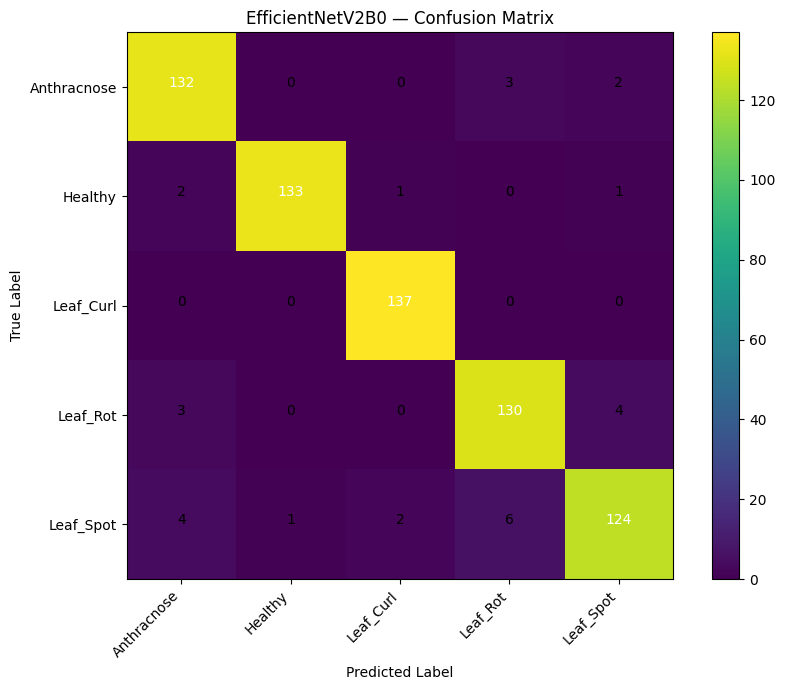

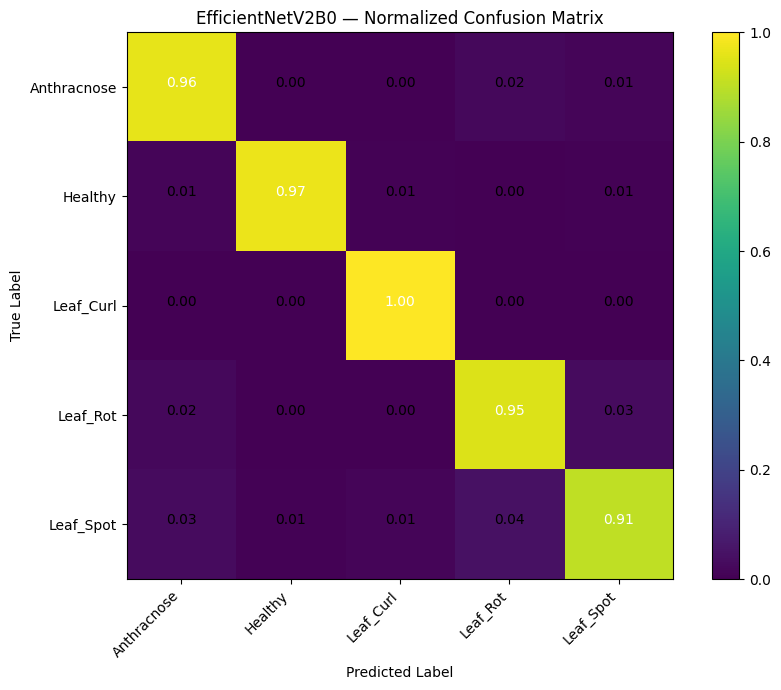

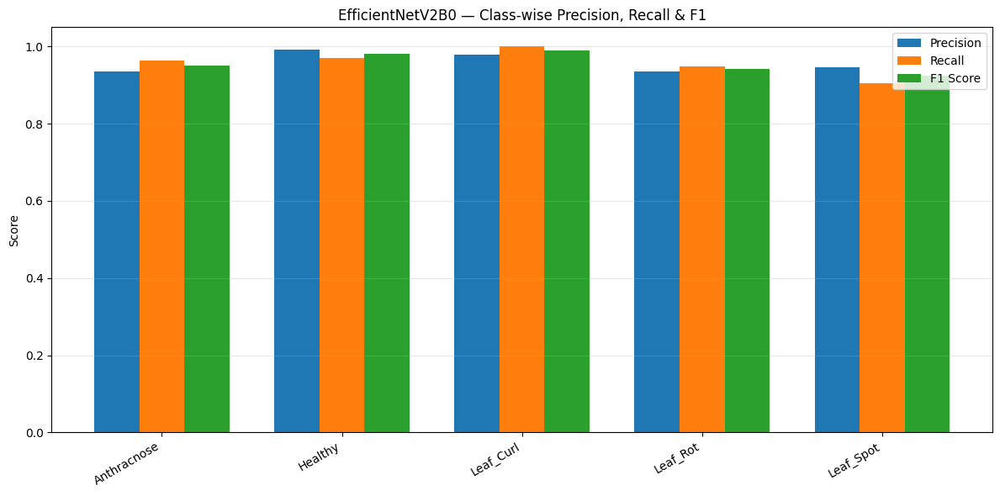

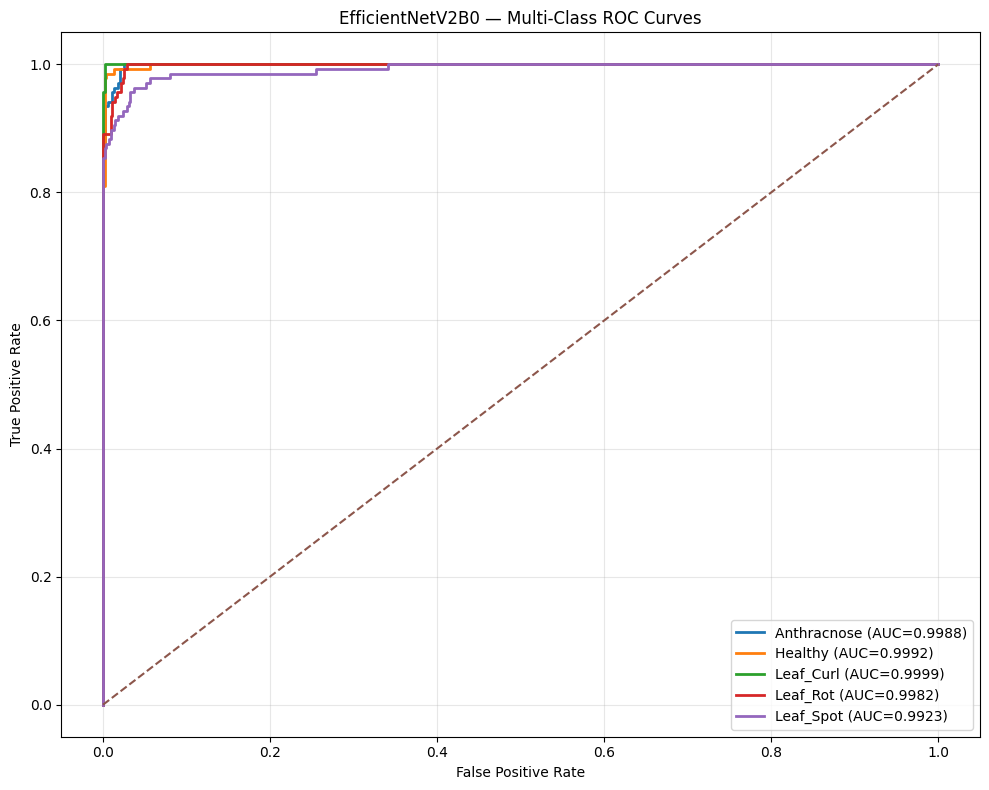

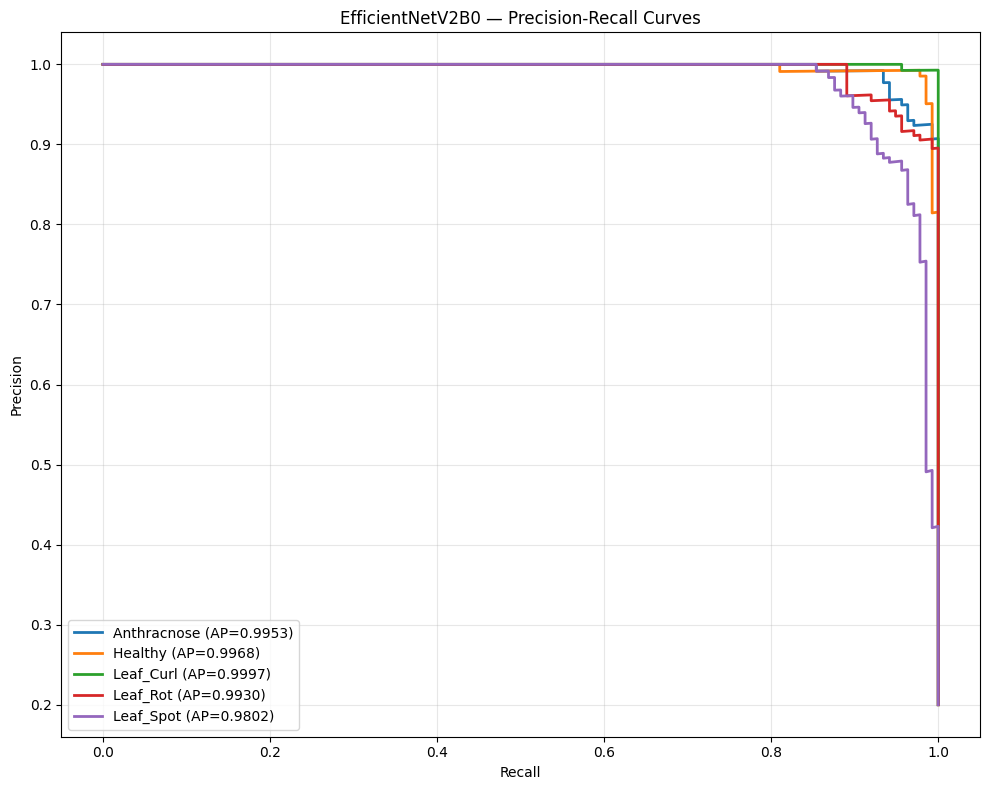

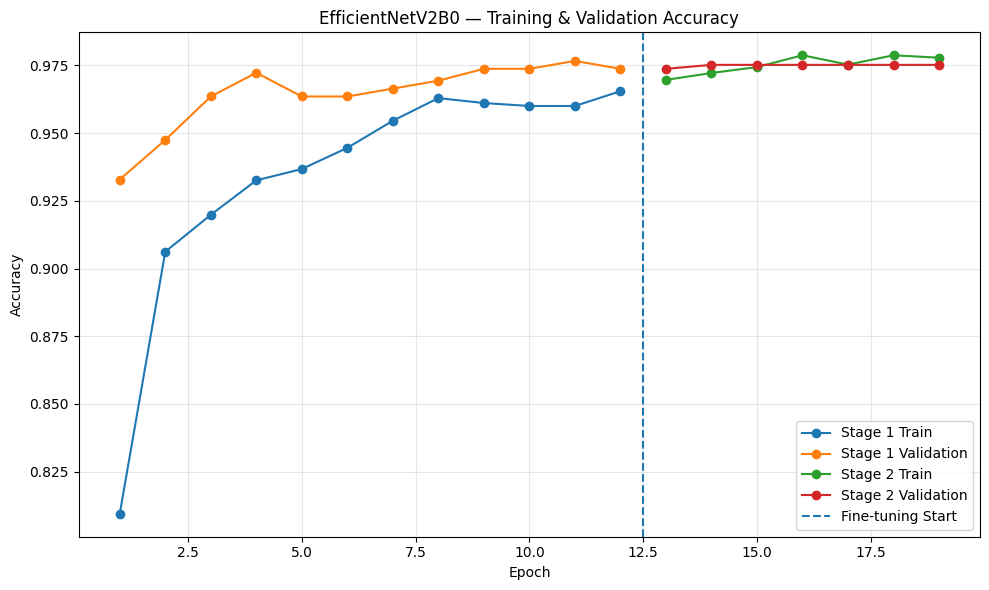

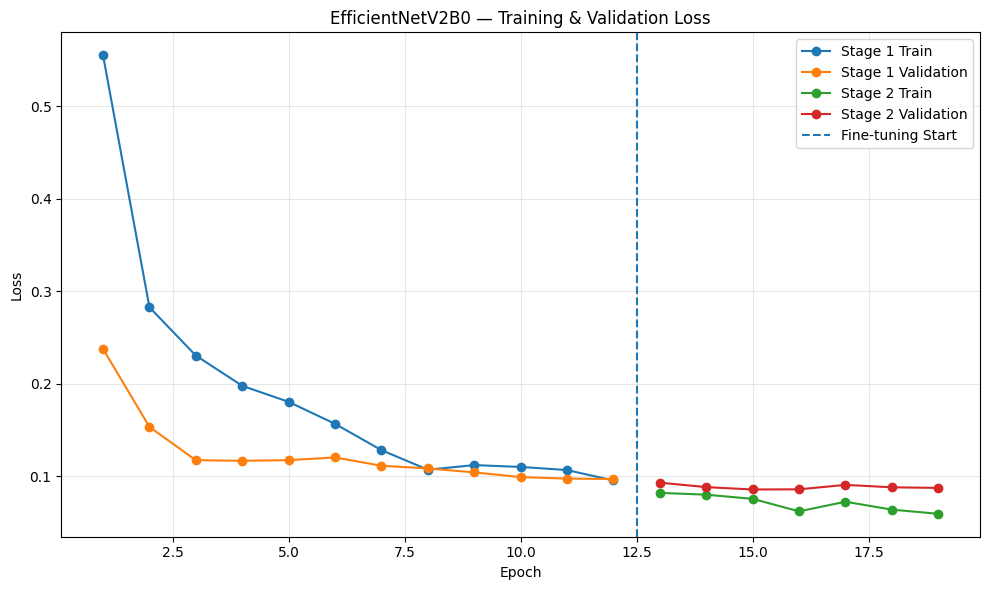


Misclassified Images: 29 / 685

EfficientNetV2B0 — BETEL LEAF DISEASE CLASSIFICATION
FINAL RESEARCH RESULTS

MODEL
------------------------------------------------------------
Architecture          : EfficientNetV2B0
Pretrained Weights    : ImageNet
Final Selected Model  : Stage 1
Input Size            : 224 x 224
Batch Size            : 32
Number of Classes     : 5

CLASSES
------------------------------------------------------------
['Anthracnose', 'Healthy', 'Leaf_Curl', 'Leaf_Rot', 'Leaf_Spot']

DATASET
------------------------------------------------------------
Training Images       : 5500
Validation Images     : 685
Test Images           : 685

Stage 1 Validation Accuracy : 97.66%
Stage 2 Validation Accuracy : 97.52%

Stage 1 selected because it achieved the higher validation accuracy.

FINAL TEST RESULTS
------------------------------------------------------------
Test Loss             : 0.1101
Accuracy              : 95.77%

Precision (Macro)     : 95.78%
Recall (Macro)      

In [7]:
# ============================================================
# CELL 4 — COMPLETE FINAL EVALUATION + ALL RESULTS + ZIP
# EfficientNetV2B0 — Betel Leaf Disease Classification
# ============================================================

import os
import json
import shutil
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

from sklearn.preprocessing import label_binarize

warnings.filterwarnings("ignore")

# ============================================================
# 1. FINAL PATHS
# ============================================================

FINAL_RESULTS_DIR = os.path.join(
    RESULT_DIR,
    "Final_Results"
)

os.makedirs(
    FINAL_RESULTS_DIR,
    exist_ok=True
)

FINAL_MODEL_PATH = STAGE1_MODEL_PATH

print("=" * 75)
print("EfficientNetV2B0 — FINAL TEST EVALUATION")
print("=" * 75)

print("Selected Model : Stage 1")
print("Model Path     :", FINAL_MODEL_PATH)
print("Results Folder :", FINAL_RESULTS_DIR)

# ============================================================
# 2. LOAD FINAL SELECTED MODEL
# ============================================================

final_model = tf.keras.models.load_model(
    FINAL_MODEL_PATH
)

print("\n✅ Final model loaded successfully.")

# ============================================================
# 3. DIRECT KERAS TEST EVALUATION
# ============================================================

test_loss, test_accuracy_keras = final_model.evaluate(
    test_ds,
    verbose=1
)

# ============================================================
# 4. GET TRUE LABELS
# ============================================================

y_true_onehot = np.concatenate([
    labels.numpy()
    for images, labels in test_ds
])

y_true = np.argmax(
    y_true_onehot,
    axis=1
)

# ============================================================
# 5. PREDICTIONS
# ============================================================

print("\nGenerating predictions...")

y_prob = final_model.predict(
    test_ds,
    verbose=1
)

y_pred = np.argmax(
    y_prob,
    axis=1
)

# ============================================================
# 6. OVERALL METRICS
# ============================================================

accuracy = accuracy_score(
    y_true,
    y_pred
)

precision_macro = precision_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

precision_weighted = precision_score(
    y_true,
    y_pred,
    average="weighted",
    zero_division=0
)

recall_weighted = recall_score(
    y_true,
    y_pred,
    average="weighted",
    zero_division=0
)

f1_weighted = f1_score(
    y_true,
    y_pred,
    average="weighted",
    zero_division=0
)

# ============================================================
# 7. ROC-AUC
# ============================================================

roc_auc_macro = roc_auc_score(
    y_true_onehot,
    y_prob,
    average="macro",
    multi_class="ovr"
)

roc_auc_weighted = roc_auc_score(
    y_true_onehot,
    y_prob,
    average="weighted",
    multi_class="ovr"
)

# ============================================================
# 8. PRINT FINAL RESULTS
# ============================================================

print("\n" + "=" * 75)
print("🏆 EfficientNetV2B0 FINAL TEST RESULTS")
print("=" * 75)

print(f"Test Loss             : {test_loss:.4f}")
print(f"Accuracy              : {accuracy * 100:.2f}%")

print("-" * 75)

print(f"Precision (Macro)     : {precision_macro * 100:.2f}%")
print(f"Recall (Macro)        : {recall_macro * 100:.2f}%")
print(f"F1 Score (Macro)      : {f1_macro * 100:.2f}%")
print(f"ROC-AUC (Macro)       : {roc_auc_macro:.4f}")

print("-" * 75)

print(f"Precision (Weighted)  : {precision_weighted * 100:.2f}%")
print(f"Recall (Weighted)     : {recall_weighted * 100:.2f}%")
print(f"F1 Score (Weighted)   : {f1_weighted * 100:.2f}%")
print(f"ROC-AUC (Weighted)    : {roc_auc_weighted:.4f}")

print("=" * 75)

# ============================================================
# 9. CLASSIFICATION REPORT
# ============================================================

report_dict = classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    output_dict=True,
    zero_division=0
)

report_text = classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    digits=4,
    zero_division=0
)

print("\nCLASSIFICATION REPORT")
print("=" * 75)
print(report_text)

report_df = pd.DataFrame(
    report_dict
).transpose()

report_df.to_csv(
    os.path.join(
        FINAL_RESULTS_DIR,
        "classification_report.csv"
    )
)

with open(
    os.path.join(
        FINAL_RESULTS_DIR,
        "classification_report.txt"
    ),
    "w"
) as f:
    f.write(report_text)

# ============================================================
# 10. CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(
    figsize=(9, 7)
)

plt.imshow(
    cm,
    interpolation="nearest"
)

plt.title(
    "EfficientNetV2B0 — Confusion Matrix"
)

plt.colorbar()

tick_marks = np.arange(
    len(class_names)
)

plt.xticks(
    tick_marks,
    class_names,
    rotation=45,
    ha="right"
)

plt.yticks(
    tick_marks,
    class_names
)

threshold = cm.max() / 2

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):

        plt.text(
            j,
            i,
            format(cm[i, j], "d"),
            horizontalalignment="center",
            color="white" if cm[i, j] > threshold else "black"
        )

plt.ylabel("True Label")
plt.xlabel("Predicted Label")

plt.tight_layout()

plt.savefig(
    os.path.join(
        FINAL_RESULTS_DIR,
        "confusion_matrix.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# ============================================================
# 11. NORMALIZED CONFUSION MATRIX
# ============================================================

cm_normalized = (
    cm.astype("float")
    /
    cm.sum(axis=1)[:, np.newaxis]
)

plt.figure(
    figsize=(9, 7)
)

plt.imshow(
    cm_normalized,
    interpolation="nearest",
    vmin=0,
    vmax=1
)

plt.title(
    "EfficientNetV2B0 — Normalized Confusion Matrix"
)

plt.colorbar()

plt.xticks(
    tick_marks,
    class_names,
    rotation=45,
    ha="right"
)

plt.yticks(
    tick_marks,
    class_names
)

for i in range(cm_normalized.shape[0]):
    for j in range(cm_normalized.shape[1]):

        plt.text(
            j,
            i,
            f"{cm_normalized[i, j]:.2f}",
            horizontalalignment="center",
            color="white"
            if cm_normalized[i, j] > 0.50
            else "black"
        )

plt.ylabel("True Label")
plt.xlabel("Predicted Label")

plt.tight_layout()

plt.savefig(
    os.path.join(
        FINAL_RESULTS_DIR,
        "normalized_confusion_matrix.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# ============================================================
# 12. CLASS-WISE METRICS
# ============================================================

class_precision = []
class_recall = []
class_f1 = []

for cls in class_names:

    class_precision.append(
        report_dict[cls]["precision"]
    )

    class_recall.append(
        report_dict[cls]["recall"]
    )

    class_f1.append(
        report_dict[cls]["f1-score"]
    )

class_metrics_df = pd.DataFrame({
    "Class": class_names,
    "Precision": class_precision,
    "Recall": class_recall,
    "F1_Score": class_f1
})

class_metrics_df.to_csv(
    os.path.join(
        FINAL_RESULTS_DIR,
        "classwise_metrics.csv"
    ),
    index=False
)

# ============================================================
# 13. CLASS-WISE BAR CHART
# ============================================================

x = np.arange(
    len(class_names)
)

width = 0.25

plt.figure(
    figsize=(12, 6)
)

plt.bar(
    x - width,
    class_precision,
    width,
    label="Precision"
)

plt.bar(
    x,
    class_recall,
    width,
    label="Recall"
)

plt.bar(
    x + width,
    class_f1,
    width,
    label="F1 Score"
)

plt.xticks(
    x,
    class_names,
    rotation=30,
    ha="right"
)

plt.ylim(
    0,
    1.05
)

plt.ylabel("Score")

plt.title(
    "EfficientNetV2B0 — Class-wise Precision, Recall & F1"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        FINAL_RESULTS_DIR,
        "classwise_precision_recall_f1.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# ============================================================
# 14. MULTI-CLASS ROC CURVE
# ============================================================

y_true_binary = label_binarize(
    y_true,
    classes=np.arange(NUM_CLASSES)
)

plt.figure(
    figsize=(10, 8)
)

roc_details = {}

for i, cls in enumerate(class_names):

    fpr, tpr, _ = roc_curve(
        y_true_binary[:, i],
        y_prob[:, i]
    )

    class_auc = auc(
        fpr,
        tpr
    )

    roc_details[cls] = class_auc

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"{cls} (AUC={class_auc:.4f})"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--"
)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

plt.title(
    "EfficientNetV2B0 — Multi-Class ROC Curves"
)

plt.legend(
    loc="lower right"
)

plt.grid(
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        FINAL_RESULTS_DIR,
        "roc_curve.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# ============================================================
# 15. PRECISION-RECALL CURVES
# ============================================================

plt.figure(
    figsize=(10, 8)
)

pr_details = {}

for i, cls in enumerate(class_names):

    precision_curve, recall_curve, _ = (
        precision_recall_curve(
            y_true_binary[:, i],
            y_prob[:, i]
        )
    )

    ap = average_precision_score(
        y_true_binary[:, i],
        y_prob[:, i]
    )

    pr_details[cls] = ap

    plt.plot(
        recall_curve,
        precision_curve,
        linewidth=2,
        label=f"{cls} (AP={ap:.4f})"
    )

plt.xlabel("Recall")
plt.ylabel("Precision")

plt.title(
    "EfficientNetV2B0 — Precision-Recall Curves"
)

plt.legend(
    loc="lower left"
)

plt.grid(
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        FINAL_RESULTS_DIR,
        "precision_recall_curve.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# ============================================================
# 16. LOAD TRAINING LOGS
# Works even if history variables are unavailable
# ============================================================

stage1_log_path = os.path.join(
    RESULT_DIR,
    "efficientnetv2_stage1_log.csv"
)

stage2_log_path = os.path.join(
    RESULT_DIR,
    "efficientnetv2_stage2_log.csv"
)

stage1_df = pd.read_csv(
    stage1_log_path
)

stage2_df = pd.read_csv(
    stage2_log_path
)

stage1_epochs = np.arange(
    1,
    len(stage1_df) + 1
)

stage2_epochs = np.arange(
    len(stage1_df) + 1,
    len(stage1_df) + len(stage2_df) + 1
)

# ============================================================
# 17. ACCURACY CURVE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    stage1_epochs,
    stage1_df["accuracy"],
    marker="o",
    label="Stage 1 Train"
)

plt.plot(
    stage1_epochs,
    stage1_df["val_accuracy"],
    marker="o",
    label="Stage 1 Validation"
)

plt.plot(
    stage2_epochs,
    stage2_df["accuracy"],
    marker="o",
    label="Stage 2 Train"
)

plt.plot(
    stage2_epochs,
    stage2_df["val_accuracy"],
    marker="o",
    label="Stage 2 Validation"
)

plt.axvline(
    len(stage1_df) + 0.5,
    linestyle="--",
    label="Fine-tuning Start"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.title(
    "EfficientNetV2B0 — Training & Validation Accuracy"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        FINAL_RESULTS_DIR,
        "training_validation_accuracy.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# ============================================================
# 18. LOSS CURVE
# ============================================================

plt.figure(
    figsize=(10, 6)
)

plt.plot(
    stage1_epochs,
    stage1_df["loss"],
    marker="o",
    label="Stage 1 Train"
)

plt.plot(
    stage1_epochs,
    stage1_df["val_loss"],
    marker="o",
    label="Stage 1 Validation"
)

plt.plot(
    stage2_epochs,
    stage2_df["loss"],
    marker="o",
    label="Stage 2 Train"
)

plt.plot(
    stage2_epochs,
    stage2_df["val_loss"],
    marker="o",
    label="Stage 2 Validation"
)

plt.axvline(
    len(stage1_df) + 0.5,
    linestyle="--",
    label="Fine-tuning Start"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.title(
    "EfficientNetV2B0 — Training & Validation Loss"
)

plt.legend()

plt.grid(
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        FINAL_RESULTS_DIR,
        "training_validation_loss.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# ============================================================
# 19. SAVE EVERY TEST PREDICTION
# ============================================================

prediction_df = pd.DataFrame({
    "True_Class": [
        class_names[i]
        for i in y_true
    ],

    "Predicted_Class": [
        class_names[i]
        for i in y_pred
    ],

    "Correct": (
        y_true == y_pred
    ),

    "Confidence": np.max(
        y_prob,
        axis=1
    )
})

for i, cls in enumerate(class_names):

    prediction_df[
        f"Probability_{cls}"
    ] = y_prob[:, i]

prediction_df.to_csv(
    os.path.join(
        FINAL_RESULTS_DIR,
        "test_predictions.csv"
    ),
    index=False
)

# ============================================================
# 20. MISCLASSIFICATION CSV
# ============================================================

misclassified_df = prediction_df[
    prediction_df["Correct"] == False
].copy()

misclassified_df.to_csv(
    os.path.join(
        FINAL_RESULTS_DIR,
        "misclassified_predictions.csv"
    ),
    index=False
)

print(
    "\nMisclassified Images:",
    len(misclassified_df),
    "/",
    len(y_true)
)

# ============================================================
# 21. SAVE ROC / PR CLASS-WISE VALUES
# ============================================================

roc_df = pd.DataFrame({
    "Class": class_names,
    "ROC_AUC": [
        roc_details[c]
        for c in class_names
    ],
    "Average_Precision": [
        pr_details[c]
        for c in class_names
    ]
})

roc_df.to_csv(
    os.path.join(
        FINAL_RESULTS_DIR,
        "classwise_roc_pr_metrics.csv"
    ),
    index=False
)

# ============================================================
# 22. OVERALL RESULTS CSV
# ============================================================

overall_metrics = {
    "Model": "EfficientNetV2B0",

    "Final_Selected_Stage":
        "Stage 1 Frozen Backbone",

    "Image_Size":
        "224x224",

    "Batch_Size":
        BATCH_SIZE,

    "Number_of_Classes":
        NUM_CLASSES,

    "Train_Images":
        5500,

    "Validation_Images":
        685,

    "Test_Images":
        685,

    "Stage1_Validation_Accuracy":
        stage1_val_acc,

    "Stage2_Validation_Accuracy":
        stage2_val_acc,

    "Test_Loss":
        test_loss,

    "Test_Accuracy":
        accuracy,

    "Precision_Macro":
        precision_macro,

    "Recall_Macro":
        recall_macro,

    "F1_Macro":
        f1_macro,

    "ROC_AUC_Macro":
        roc_auc_macro,

    "Precision_Weighted":
        precision_weighted,

    "Recall_Weighted":
        recall_weighted,

    "F1_Weighted":
        f1_weighted,

    "ROC_AUC_Weighted":
        roc_auc_weighted
}

overall_df = pd.DataFrame(
    [overall_metrics]
)

overall_df.to_csv(
    os.path.join(
        FINAL_RESULTS_DIR,
        "final_metrics.csv"
    ),
    index=False
)

# ============================================================
# 23. SAVE FINAL SUMMARY TXT
# ============================================================

summary_text = f"""
============================================================
EfficientNetV2B0 — BETEL LEAF DISEASE CLASSIFICATION
FINAL RESEARCH RESULTS
============================================================

MODEL
------------------------------------------------------------
Architecture          : EfficientNetV2B0
Pretrained Weights    : ImageNet
Final Selected Model  : Stage 1
Input Size            : 224 x 224
Batch Size            : {BATCH_SIZE}
Number of Classes     : {NUM_CLASSES}

CLASSES
------------------------------------------------------------
{class_names}

DATASET
------------------------------------------------------------
Training Images       : 5500
Validation Images     : 685
Test Images           : 685

Stage 1 Validation Accuracy : {stage1_val_acc*100:.2f}%
Stage 2 Validation Accuracy : {stage2_val_acc*100:.2f}%

Stage 1 selected because it achieved the higher validation accuracy.

FINAL TEST RESULTS
------------------------------------------------------------
Test Loss             : {test_loss:.4f}
Accuracy              : {accuracy*100:.2f}%

Precision (Macro)     : {precision_macro*100:.2f}%
Recall (Macro)        : {recall_macro*100:.2f}%
F1 Score (Macro)      : {f1_macro*100:.2f}%
ROC-AUC (Macro)       : {roc_auc_macro:.4f}

Precision (Weighted)  : {precision_weighted*100:.2f}%
Recall (Weighted)     : {recall_weighted*100:.2f}%
F1 Score (Weighted)   : {f1_weighted*100:.2f}%
ROC-AUC (Weighted)    : {roc_auc_weighted:.4f}

Correct Predictions   : {np.sum(y_true == y_pred)}
Misclassifications    : {np.sum(y_true != y_pred)}
Total Test Images     : {len(y_true)}

============================================================
"""

with open(
    os.path.join(
        FINAL_RESULTS_DIR,
        "FINAL_SUMMARY.txt"
    ),
    "w"
) as f:
    f.write(summary_text)

print(summary_text)

# ============================================================
# 24. COPY FINAL MODEL TO RESULTS
# ============================================================

FINAL_MODEL_COPY = os.path.join(
    FINAL_RESULTS_DIR,
    "EfficientNetV2B0_Final_Model.keras"
)

shutil.copy2(
    FINAL_MODEL_PATH,
    FINAL_MODEL_COPY
)

# ============================================================
# 25. SAVE TRAINING LOGS
# ============================================================

shutil.copy2(
    stage1_log_path,
    os.path.join(
        FINAL_RESULTS_DIR,
        "stage1_training_log.csv"
    )
)

shutil.copy2(
    stage2_log_path,
    os.path.join(
        FINAL_RESULTS_DIR,
        "stage2_finetuning_log.csv"
    )
)

# ============================================================
# 26. CREATE FINAL ZIP
# ============================================================

ZIP_BASE = (
    "/kaggle/working/"
    "EfficientNetV2B0_Final_Results"
)

ZIP_PATH = shutil.make_archive(
    ZIP_BASE,
    "zip",
    FINAL_RESULTS_DIR
)

# ============================================================
# 27. LIST ALL GENERATED FILES
# ============================================================

print("\n" + "=" * 75)
print("📂 GENERATED FINAL FILES")
print("=" * 75)

for filename in sorted(
    os.listdir(FINAL_RESULTS_DIR)
):
    print("✓", filename)

# ============================================================
# 28. FINAL MESSAGE
# ============================================================

print("\n" + "=" * 75)
print("🎉 EVERYTHING COMPLETED SUCCESSFULLY")
print("=" * 75)

print("\nFinal Model:")
print(FINAL_MODEL_COPY)

print("\nFinal Results Folder:")
print(FINAL_RESULTS_DIR)

print("\nFinal ZIP:")
print(ZIP_PATH)

print("\n✅ Download this ZIP from Kaggle Output:")
print("EfficientNetV2B0_Final_Results.zip")

EfficientNetV2B0 — ADDITIONAL RESEARCH ANALYSIS
✅ Required files verified.
✅ Final Stage-1 model loaded.

ACTUAL TRAINING INFORMATION
Stage 1 Actual Epochs : 12
Stage 2 Actual Epochs : 7
Total Actual Epochs   : 19

PARAMETER INFORMATION
Total Parameters     : 6,253,653
Stage-1 Trainable    : 331,781
Stage-1 Non-trainable: 5,921,872
Stage-2 Trainable    : 2,039,573
Found 685 files belonging to 5 classes.

Generating test predictions...
22/22 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step 


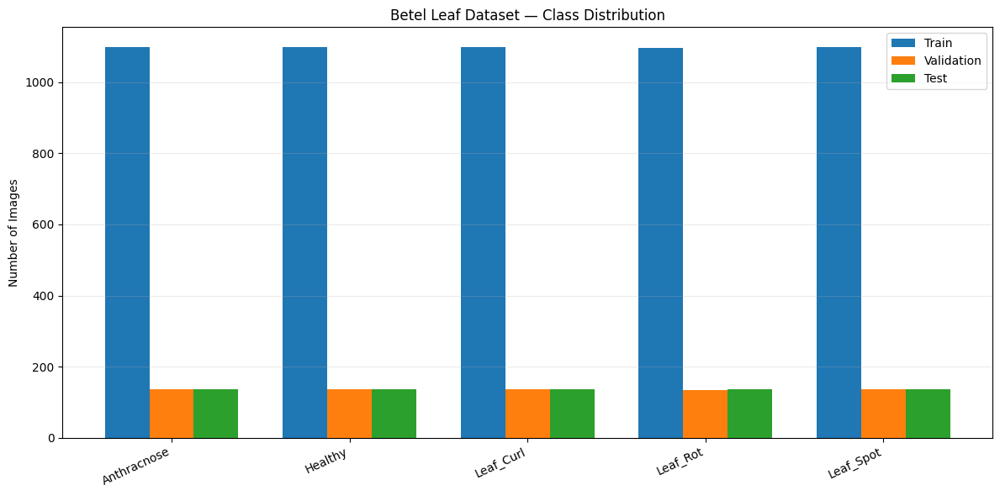

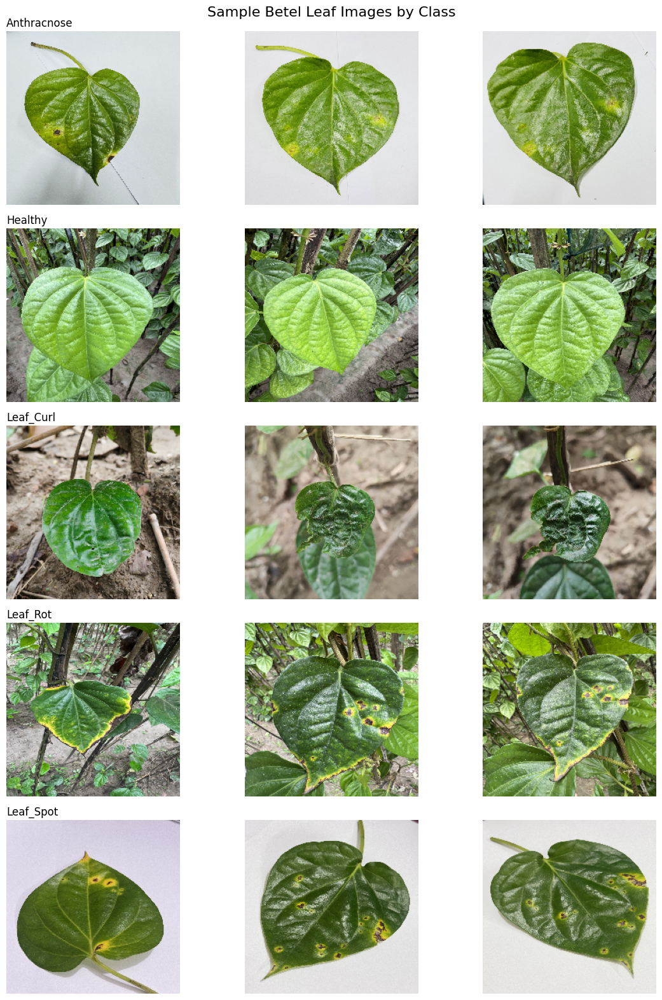

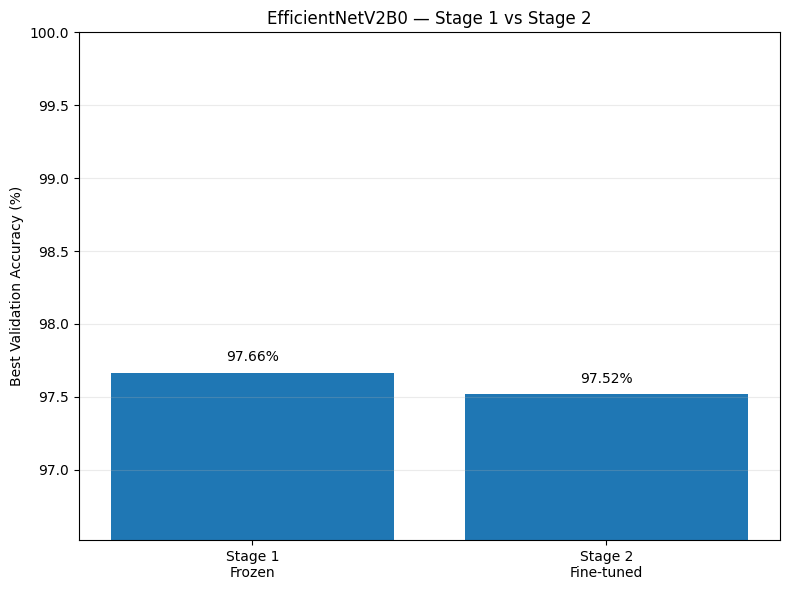

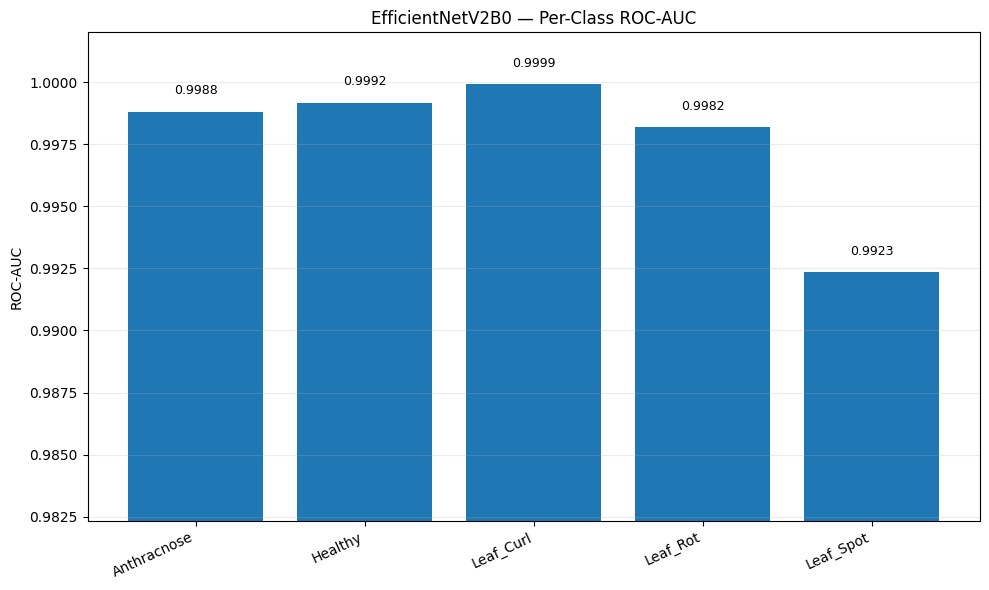

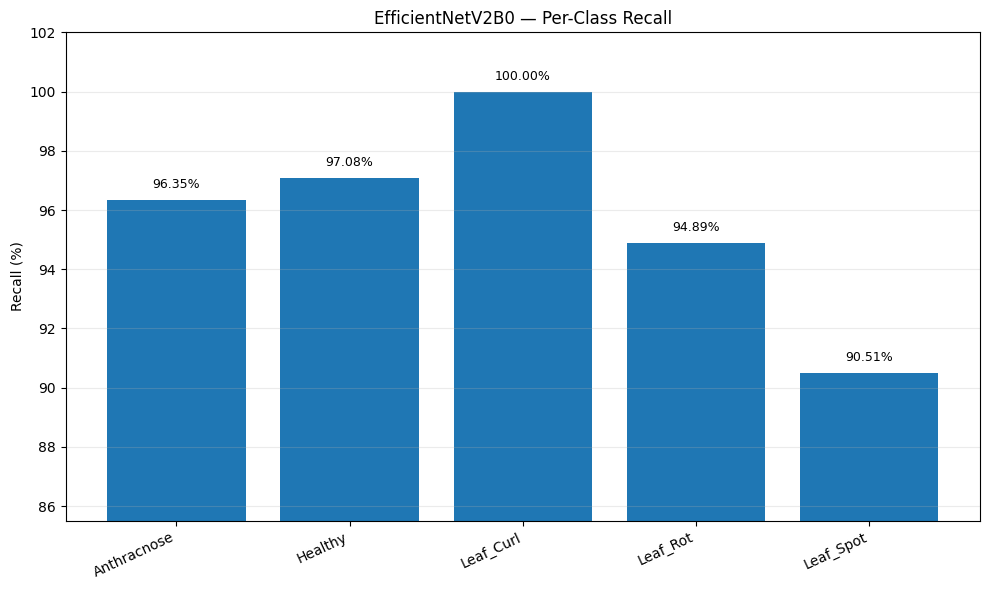

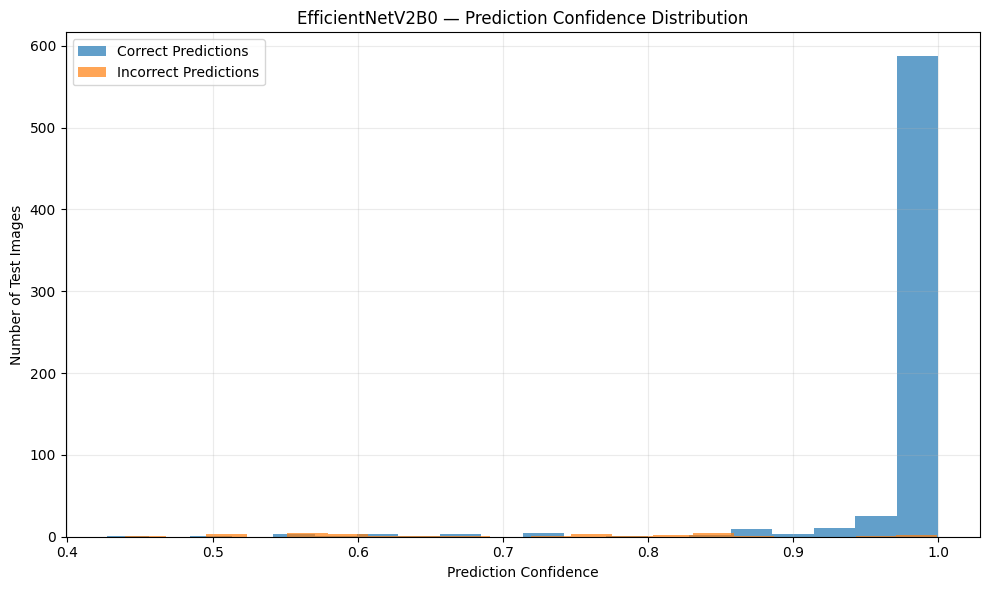

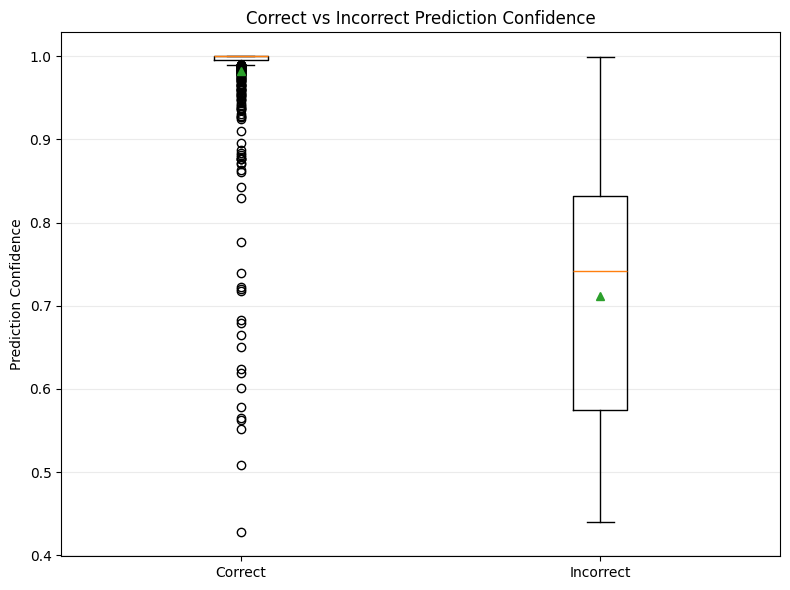

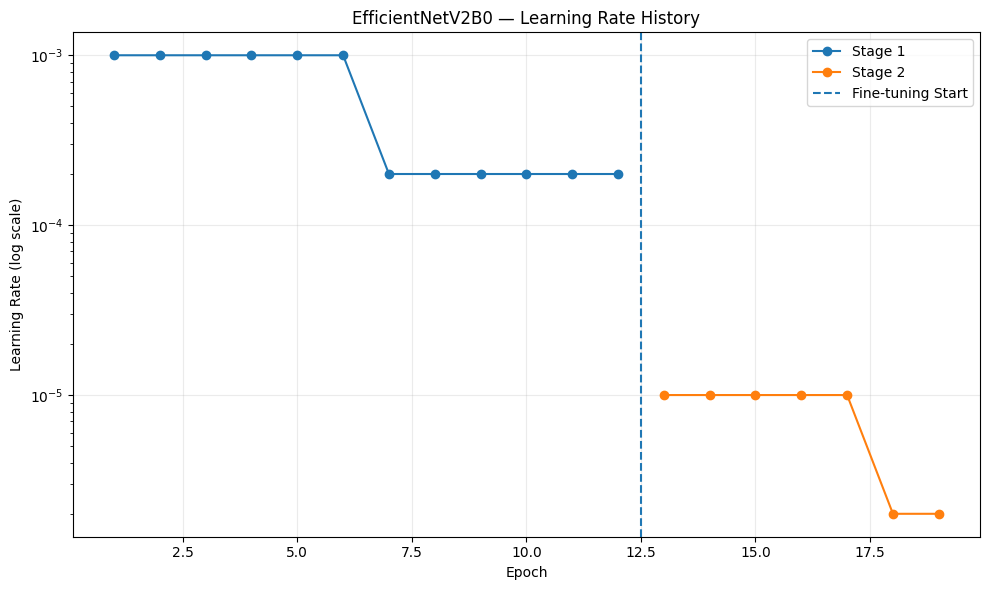

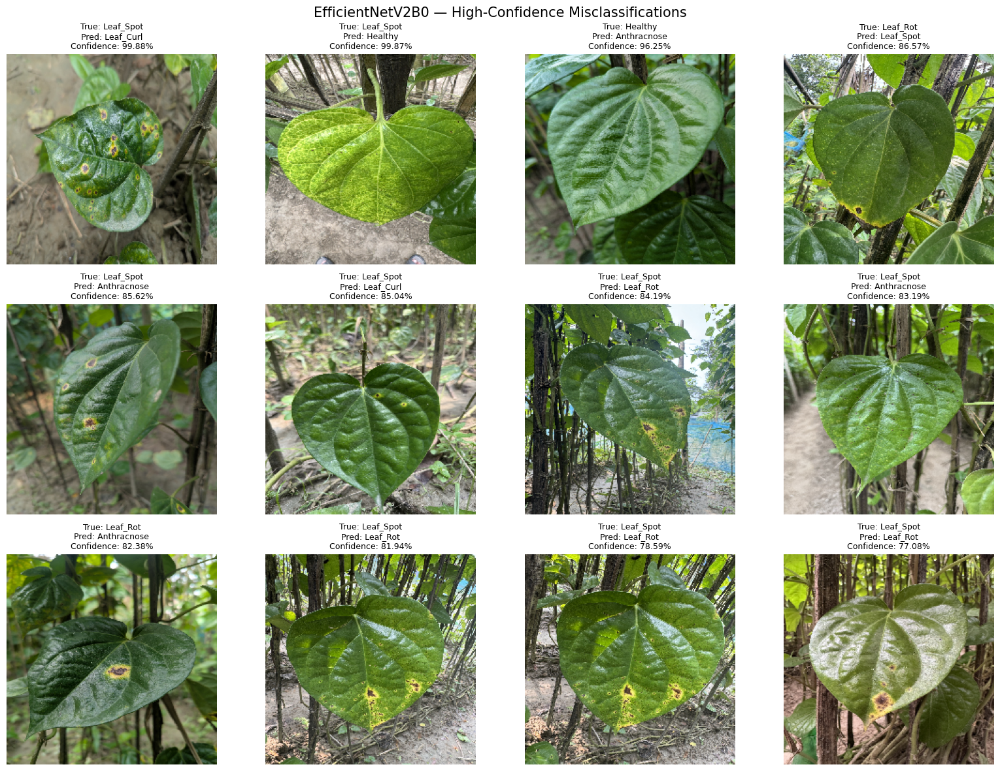


Grad-CAM target layer: top_activation


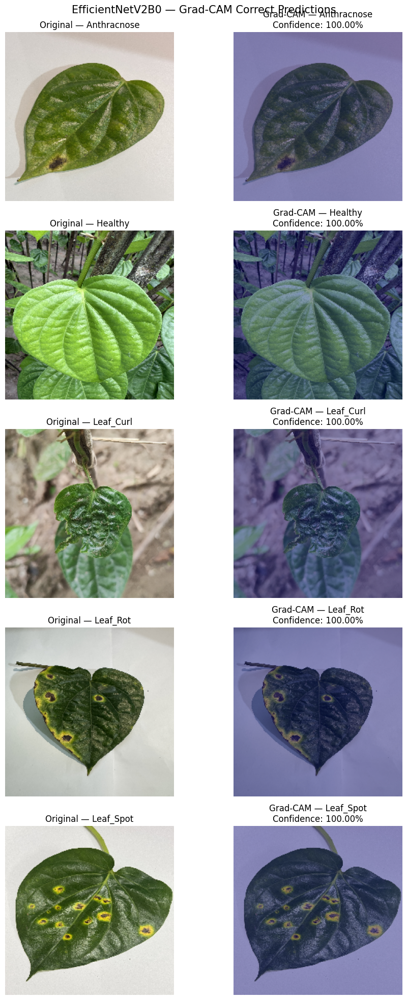

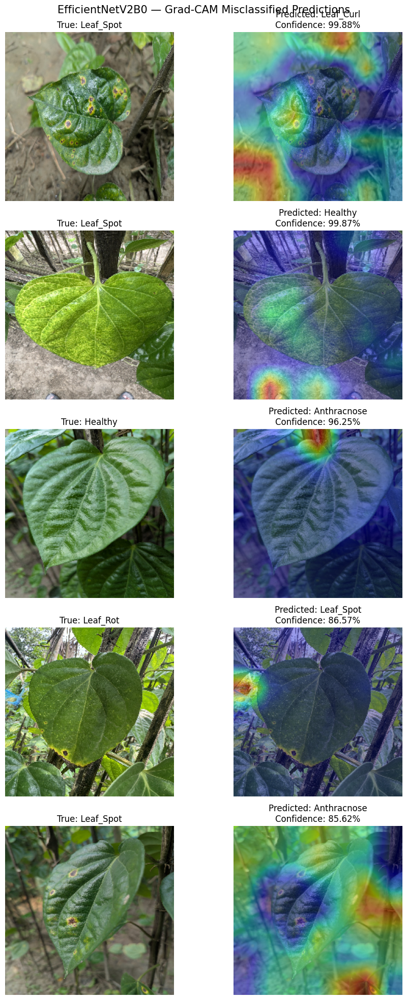

✅ Detailed architecture PNG created.


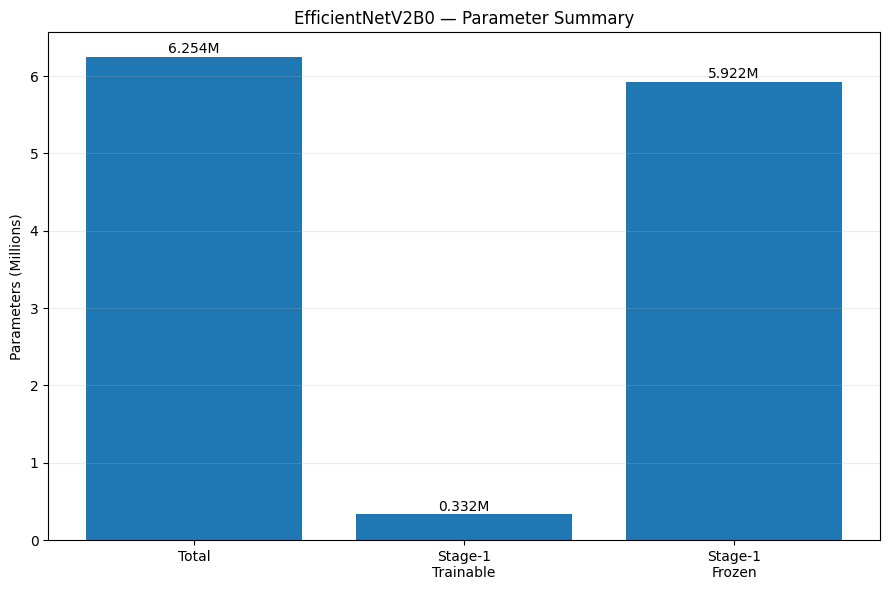


EfficientNetV2B0 — COMPLETE EXPERIMENT SUMMARY

MODEL
----------------------------------------------------------------------
Architecture              : EfficientNetV2B0
Pretrained Weights        : ImageNet
Input Size                : 224 x 224 x 3
Batch Size                : 32
Seed                      : 42
Number of Classes         : 5

Classes:
['Anthracnose', 'Healthy', 'Leaf_Curl', 'Leaf_Rot', 'Leaf_Spot']

DATASET
----------------------------------------------------------------------
Training Images           : 5497
Validation Images         : 683
Test Images               : 685

PARAMETERS
----------------------------------------------------------------------
Total Parameters          : 6,253,653
Stage-1 Trainable         : 331,781
Stage-1 Non-Trainable     : 5,921,872

TRAINING STRATEGY
----------------------------------------------------------------------
Stage 1:
Backbone                  : Frozen
Initial Learning Rate     : 0.001
Maximum Epochs            : 12
Actual Epoch

In [8]:
# =====================================================================
# ONE CELL — ALL ADDITIONAL RESEARCH ANALYSIS / PNG / SUMMARY / ZIP
# EfficientNetV2B0 — Betel Leaf Disease Classification
# =====================================================================

import os
import glob
import shutil
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score,
    accuracy_score
)

warnings.filterwarnings("ignore")

# =====================================================================
# 1. PATHS
# =====================================================================

DATASET_ROOT = (
    "/kaggle/input/datasets/"
    "efrathhossainshihab/"
    "betel-leaf-dataset-split/"
    "Betel_Leaf_DataSet_Split"
)

TRAIN_DIR = os.path.join(DATASET_ROOT, "train_augmented_1100")
VAL_DIR   = os.path.join(DATASET_ROOT, "validation")
TEST_DIR  = os.path.join(DATASET_ROOT, "test")

RESULT_ROOT = "/kaggle/working/EfficientNetV2"

FINAL_RESULTS_DIR = os.path.join(
    RESULT_ROOT,
    "Final_Results"
)

EXTRA_DIR = os.path.join(
    RESULT_ROOT,
    "Additional_Analysis"
)

os.makedirs(EXTRA_DIR, exist_ok=True)

STAGE1_MODEL_PATH = os.path.join(
    RESULT_ROOT,
    "efficientnetv2_stage1_best.keras"
)

STAGE2_MODEL_PATH = os.path.join(
    RESULT_ROOT,
    "efficientnetv2_stage2_best.keras"
)

STAGE1_LOG_PATH = os.path.join(
    RESULT_ROOT,
    "efficientnetv2_stage1_log.csv"
)

STAGE2_LOG_PATH = os.path.join(
    RESULT_ROOT,
    "efficientnetv2_stage2_log.csv"
)

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

CLASS_NAMES = [
    "Anthracnose",
    "Healthy",
    "Leaf_Curl",
    "Leaf_Rot",
    "Leaf_Spot"
]

NUM_CLASSES = len(CLASS_NAMES)

print("=" * 80)
print("EfficientNetV2B0 — ADDITIONAL RESEARCH ANALYSIS")
print("=" * 80)

# =====================================================================
# 2. VERIFY FILES
# =====================================================================

required_paths = [
    TRAIN_DIR,
    VAL_DIR,
    TEST_DIR,
    STAGE1_MODEL_PATH,
    STAGE1_LOG_PATH,
    STAGE2_LOG_PATH
]

for path in required_paths:
    if not os.path.exists(path):
        raise FileNotFoundError(
            f"Required path not found:\n{path}"
        )

print("✅ Required files verified.")

# =====================================================================
# 3. LOAD FINAL SELECTED MODEL
# =====================================================================

model = tf.keras.models.load_model(
    STAGE1_MODEL_PATH
)

print("✅ Final Stage-1 model loaded.")

# =====================================================================
# 4. LOAD STAGE-2 MODEL FOR PARAMETER ANALYSIS
# =====================================================================

stage2_model = None

if os.path.exists(STAGE2_MODEL_PATH):
    stage2_model = tf.keras.models.load_model(
        STAGE2_MODEL_PATH
    )

# =====================================================================
# 5. TRAINING LOGS
# =====================================================================

stage1_df = pd.read_csv(STAGE1_LOG_PATH)
stage2_df = pd.read_csv(STAGE2_LOG_PATH)

STAGE1_ACTUAL_EPOCHS = len(stage1_df)
STAGE2_ACTUAL_EPOCHS = len(stage2_df)
TOTAL_ACTUAL_EPOCHS = (
    STAGE1_ACTUAL_EPOCHS +
    STAGE2_ACTUAL_EPOCHS
)

stage1_best_val_acc = stage1_df[
    "val_accuracy"
].max()

stage2_best_val_acc = stage2_df[
    "val_accuracy"
].max()

stage1_best_val_loss = stage1_df[
    "val_loss"
].min()

stage2_best_val_loss = stage2_df[
    "val_loss"
].min()

print("\n" + "=" * 80)
print("ACTUAL TRAINING INFORMATION")
print("=" * 80)

print(
    "Stage 1 Actual Epochs :",
    STAGE1_ACTUAL_EPOCHS
)

print(
    "Stage 2 Actual Epochs :",
    STAGE2_ACTUAL_EPOCHS
)

print(
    "Total Actual Epochs   :",
    TOTAL_ACTUAL_EPOCHS
)

# =====================================================================
# 6. PARAMETER COUNTS
# =====================================================================

def parameter_counts(m):

    total = m.count_params()

    trainable = sum(
        np.prod(v.shape)
        for v in m.trainable_weights
    )

    non_trainable = sum(
        np.prod(v.shape)
        for v in m.non_trainable_weights
    )

    return (
        int(total),
        int(trainable),
        int(non_trainable)
    )


stage1_total_params, \
stage1_trainable_params, \
stage1_frozen_params = parameter_counts(model)

if stage2_model is not None:

    stage2_total_params, \
    stage2_trainable_params, \
    stage2_frozen_params = parameter_counts(
        stage2_model
    )

else:

    stage2_total_params = np.nan
    stage2_trainable_params = np.nan
    stage2_frozen_params = np.nan


print("\n" + "=" * 80)
print("PARAMETER INFORMATION")
print("=" * 80)

print(
    f"Total Parameters     : "
    f"{stage1_total_params:,}"
)

print(
    f"Stage-1 Trainable    : "
    f"{stage1_trainable_params:,}"
)

print(
    f"Stage-1 Non-trainable:"
    f" {stage1_frozen_params:,}"
)

if stage2_model is not None:

    print(
        f"Stage-2 Trainable    : "
        f"{stage2_trainable_params:,}"
    )

# =====================================================================
# 7. LOAD TEST DATASET
# =====================================================================

test_ds_raw = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=False
)

# Save file paths BEFORE prefetch
test_file_paths = list(
    test_ds_raw.file_paths
)

test_ds = test_ds_raw.prefetch(
    tf.data.AUTOTUNE
)

# =====================================================================
# 8. TRUE LABELS
# =====================================================================

y_true_onehot = np.concatenate(
    [
        labels.numpy()
        for images, labels
        in test_ds_raw
    ],
    axis=0
)

y_true = np.argmax(
    y_true_onehot,
    axis=1
)

# =====================================================================
# 9. PREDICTIONS
# =====================================================================

print("\nGenerating test predictions...")

y_prob = model.predict(
    test_ds,
    verbose=1
)

y_pred = np.argmax(
    y_prob,
    axis=1
)

confidence = np.max(
    y_prob,
    axis=1
)

correct_mask = (
    y_true == y_pred
)

incorrect_mask = ~correct_mask

# =====================================================================
# 10. FINAL TEST METRICS
# =====================================================================

accuracy = accuracy_score(
    y_true,
    y_pred
)

precision_macro = precision_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

recall_macro = recall_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

f1_macro = f1_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

roc_auc_macro = roc_auc_score(
    y_true_onehot,
    y_prob,
    average="macro",
    multi_class="ovr"
)

report = classification_report(
    y_true,
    y_pred,
    target_names=CLASS_NAMES,
    output_dict=True,
    zero_division=0
)

# =====================================================================
# 11. DATASET COUNTS
# =====================================================================

def class_counts(folder):

    counts = {}

    for cls in CLASS_NAMES:

        class_path = os.path.join(
            folder,
            cls
        )

        files = []

        for extension in [
            "*.jpg",
            "*.jpeg",
            "*.png",
            "*.bmp",
            "*.webp"
        ]:
            files.extend(
                glob.glob(
                    os.path.join(
                        class_path,
                        extension
                    )
                )
            )

        counts[cls] = len(files)

    return counts


train_counts = class_counts(TRAIN_DIR)
val_counts   = class_counts(VAL_DIR)
test_counts  = class_counts(TEST_DIR)

# =====================================================================
# PNG 1 — DATASET CLASS DISTRIBUTION
# Necessary once for research
# =====================================================================

x = np.arange(NUM_CLASSES)
width = 0.25

plt.figure(figsize=(12, 6))

plt.bar(
    x - width,
    [train_counts[c] for c in CLASS_NAMES],
    width,
    label="Train"
)

plt.bar(
    x,
    [val_counts[c] for c in CLASS_NAMES],
    width,
    label="Validation"
)

plt.bar(
    x + width,
    [test_counts[c] for c in CLASS_NAMES],
    width,
    label="Test"
)

plt.xticks(
    x,
    CLASS_NAMES,
    rotation=25,
    ha="right"
)

plt.ylabel("Number of Images")

plt.title(
    "Betel Leaf Dataset — Class Distribution"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "dataset_class_distribution.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 2 — SAMPLE IMAGES PER CLASS
# Necessary once for research
# =====================================================================

SAMPLES_PER_CLASS = 3

fig, axes = plt.subplots(
    NUM_CLASSES,
    SAMPLES_PER_CLASS,
    figsize=(12, 16)
)

for row, cls in enumerate(CLASS_NAMES):

    class_files = []

    for extension in [
        "*.jpg",
        "*.jpeg",
        "*.png",
        "*.webp"
    ]:

        class_files.extend(
            glob.glob(
                os.path.join(
                    TEST_DIR,
                    cls,
                    extension
                )
            )
        )

    class_files = sorted(
        class_files
    )[:SAMPLES_PER_CLASS]

    for col in range(
        SAMPLES_PER_CLASS
    ):

        ax = axes[row, col]

        if col < len(class_files):

            img = tf.keras.utils.load_img(
                class_files[col],
                target_size=IMG_SIZE
            )

            ax.imshow(img)

        ax.axis("off")

        if col == 0:
            ax.set_title(
                cls,
                loc="left",
                fontsize=12
            )

plt.suptitle(
    "Sample Betel Leaf Images by Class",
    fontsize=16
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "sample_images_per_class.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 3 — STAGE 1 VS STAGE 2 VALIDATION ACCURACY
# Recommended
# =====================================================================

labels = [
    "Stage 1\nFrozen",
    "Stage 2\nFine-tuned"
]

values = [
    stage1_best_val_acc * 100,
    stage2_best_val_acc * 100
]

plt.figure(figsize=(8, 6))

bars = plt.bar(
    labels,
    values
)

plt.ylabel(
    "Best Validation Accuracy (%)"
)

plt.title(
    "EfficientNetV2B0 — Stage 1 vs Stage 2"
)

plt.ylim(
    min(values) - 1,
    100
)

for bar, value in zip(
    bars,
    values
):

    plt.text(
        bar.get_x() +
        bar.get_width()/2,
        value + 0.08,
        f"{value:.2f}%",
        ha="center"
    )

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "stage1_vs_stage2_validation_accuracy.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 4 — PER-CLASS ROC-AUC BAR
# Recommended
# =====================================================================

class_auc = []

for i, cls in enumerate(CLASS_NAMES):

    auc_value = roc_auc_score(
        y_true_onehot[:, i],
        y_prob[:, i]
    )

    class_auc.append(
        auc_value
    )

plt.figure(figsize=(10, 6))

bars = plt.bar(
    CLASS_NAMES,
    class_auc
)

plt.ylim(
    min(class_auc) - 0.01,
    1.002
)

plt.ylabel("ROC-AUC")

plt.title(
    "EfficientNetV2B0 — Per-Class ROC-AUC"
)

plt.xticks(
    rotation=25,
    ha="right"
)

for bar, value in zip(
    bars,
    class_auc
):

    plt.text(
        bar.get_x() +
        bar.get_width()/2,
        value + 0.0007,
        f"{value:.4f}",
        ha="center",
        fontsize=9
    )

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "per_class_roc_auc.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 5 — PER-CLASS RECALL
# Recommended
# =====================================================================

class_recall = [
    report[c]["recall"]
    for c in CLASS_NAMES
]

plt.figure(figsize=(10, 6))

bars = plt.bar(
    CLASS_NAMES,
    np.array(class_recall) * 100
)

plt.ylabel("Recall (%)")

plt.title(
    "EfficientNetV2B0 — Per-Class Recall"
)

plt.xticks(
    rotation=25,
    ha="right"
)

plt.ylim(
    min(class_recall) * 100 - 5,
    102
)

for bar, value in zip(
    bars,
    class_recall
):

    plt.text(
        bar.get_x() +
        bar.get_width()/2,
        value * 100 + 0.4,
        f"{value*100:.2f}%",
        ha="center",
        fontsize=9
    )

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "per_class_recall.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 6 — PREDICTION CONFIDENCE DISTRIBUTION
# Optional / useful
# =====================================================================

plt.figure(figsize=(10, 6))

plt.hist(
    confidence[correct_mask],
    bins=20,
    alpha=0.7,
    label="Correct Predictions"
)

plt.hist(
    confidence[incorrect_mask],
    bins=20,
    alpha=0.7,
    label="Incorrect Predictions"
)

plt.xlabel(
    "Prediction Confidence"
)

plt.ylabel(
    "Number of Test Images"
)

plt.title(
    "EfficientNetV2B0 — Prediction Confidence Distribution"
)

plt.legend()

plt.grid(
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "prediction_confidence_distribution.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 7 — CORRECT VS INCORRECT CONFIDENCE
# Optional
# =====================================================================

correct_conf = confidence[
    correct_mask
]

incorrect_conf = confidence[
    incorrect_mask
]

plt.figure(figsize=(8, 6))

plt.boxplot(
    [
        correct_conf,
        incorrect_conf
    ],
    tick_labels=[
        "Correct",
        "Incorrect"
    ],
    showmeans=True
)

plt.ylabel(
    "Prediction Confidence"
)

plt.title(
    "Correct vs Incorrect Prediction Confidence"
)

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "correct_vs_incorrect_confidence.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 8 — LEARNING RATE HISTORY
# Optional / Training diagnostics
# =====================================================================

def get_lr_values(
    dataframe,
    fallback_lr
):

    possible_columns = [
        "learning_rate",
        "lr"
    ]

    for col in possible_columns:

        if col in dataframe.columns:
            return dataframe[col].values

    return np.full(
        len(dataframe),
        fallback_lr
    )


stage1_lr = get_lr_values(
    stage1_df,
    1e-3
)

stage2_lr = get_lr_values(
    stage2_df,
    1e-5
)

stage1_epoch_numbers = np.arange(
    1,
    len(stage1_df) + 1
)

stage2_epoch_numbers = np.arange(
    len(stage1_df) + 1,
    len(stage1_df) +
    len(stage2_df) + 1
)

plt.figure(figsize=(10, 6))

plt.plot(
    stage1_epoch_numbers,
    stage1_lr,
    marker="o",
    label="Stage 1"
)

plt.plot(
    stage2_epoch_numbers,
    stage2_lr,
    marker="o",
    label="Stage 2"
)

plt.yscale("log")

plt.xlabel("Epoch")

plt.ylabel(
    "Learning Rate (log scale)"
)

plt.title(
    "EfficientNetV2B0 — Learning Rate History"
)

plt.axvline(
    len(stage1_df) + 0.5,
    linestyle="--",
    label="Fine-tuning Start"
)

plt.legend()

plt.grid(
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "learning_rate_history.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# PNG 9 — MISCLASSIFIED SAMPLE GRID
# Strongly Recommended
# =====================================================================

misclassified_indices = np.where(
    incorrect_mask
)[0]

# Sort wrong predictions by confidence (highest first)
misclassified_indices = sorted(
    misclassified_indices,
    key=lambda i: confidence[i],
    reverse=True
)

MAX_WRONG_IMAGES = min(
    12,
    len(misclassified_indices)
)

selected_wrong = misclassified_indices[
    :MAX_WRONG_IMAGES
]

if MAX_WRONG_IMAGES > 0:

    cols = 4
    rows = int(
        np.ceil(
            MAX_WRONG_IMAGES / cols
        )
    )

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(16, rows * 4)
    )

    axes = np.array(
        axes
    ).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for plot_index, sample_index in enumerate(
        selected_wrong
    ):

        img = tf.keras.utils.load_img(
            test_file_paths[sample_index],
            target_size=IMG_SIZE
        )

        axes[plot_index].imshow(
            img
        )

        true_name = CLASS_NAMES[
            y_true[sample_index]
        ]

        pred_name = CLASS_NAMES[
            y_pred[sample_index]
        ]

        axes[plot_index].set_title(
            f"True: {true_name}\n"
            f"Pred: {pred_name}\n"
            f"Confidence: "
            f"{confidence[sample_index]*100:.2f}%",
            fontsize=9
        )

        axes[plot_index].axis(
            "off"
        )

    plt.suptitle(
        "EfficientNetV2B0 — High-Confidence Misclassifications",
        fontsize=15
    )

    plt.tight_layout()

    plt.savefig(
        os.path.join(
            EXTRA_DIR,
            "misclassified_samples_grid.png"
        ),
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    plt.close()

# =====================================================================
# 12. GRAD-CAM SETUP
# =====================================================================

base_model = None

for layer in model.layers:

    if isinstance(
        layer,
        tf.keras.Model
    ):

        if "efficientnet" in layer.name.lower():

            base_model = layer
            break


def find_last_4d_layer(
    nested_model
):

    for layer in reversed(
        nested_model.layers
    ):

        try:

            output_shape = (
                layer.output.shape
            )

            if len(output_shape) == 4:
                return layer

        except:
            continue

    return None


last_conv_layer = None

if base_model is not None:

    last_conv_layer = (
        find_last_4d_layer(
            base_model
        )
    )

if (
    base_model is not None and
    last_conv_layer is not None
):

    print(
        "\nGrad-CAM target layer:",
        last_conv_layer.name
    )

    feature_model = tf.keras.Model(
        inputs=base_model.input,
        outputs=[
            last_conv_layer.output,
            base_model.output
        ]
    )


def make_gradcam(
    image_array,
    class_index
):

    image_tensor = tf.convert_to_tensor(
        image_array[
            np.newaxis,
            ...
        ],
        dtype=tf.float32
    )

    with tf.GradientTape() as tape:

        conv_outputs, x = feature_model(
            image_tensor,
            training=False
        )

        # Pass through classifier layers
        found_backbone = False

        for layer in model.layers:

            if layer is base_model:

                found_backbone = True
                continue

            if not found_backbone:
                continue

            try:
                x = layer(
                    x,
                    training=False
                )

            except TypeError:
                x = layer(x)

        class_score = x[
            :,
            class_index
        ]

    grads = tape.gradient(
        class_score,
        conv_outputs
    )

    if grads is None:
        return None

    pooled_grads = tf.reduce_mean(
        grads,
        axis=(0, 1, 2)
    )

    conv_outputs = tf.cast(
        conv_outputs[0],
        tf.float32
    )

    pooled_grads = tf.cast(
        pooled_grads,
        tf.float32
    )

    heatmap = tf.reduce_sum(
        conv_outputs *
        pooled_grads,
        axis=-1
    )

    heatmap = tf.maximum(
        heatmap,
        0
    )

    max_value = tf.reduce_max(
        heatmap
    )

    if max_value > 0:

        heatmap = (
            heatmap /
            max_value
        )

    return heatmap.numpy()


def load_image_array(path):

    img = tf.keras.utils.load_img(
        path,
        target_size=IMG_SIZE
    )

    return tf.keras.utils.img_to_array(
        img
    )


def overlay_gradcam(
    image_array,
    heatmap,
    alpha=0.40
):

    heatmap_resized = tf.image.resize(
        heatmap[..., np.newaxis],
        IMG_SIZE
    ).numpy().squeeze()

    cmap = plt.get_cmap(
        "jet"
    )

    colored_heatmap = cmap(
        heatmap_resized
    )[..., :3]

    image_normalized = (
        image_array / 255.0
    )

    overlay = (
        (1 - alpha) *
        image_normalized
        +
        alpha *
        colored_heatmap
    )

    overlay = np.clip(
        overlay,
        0,
        1
    )

    return overlay


# =====================================================================
# PNG 10 — GRAD-CAM CORRECT PREDICTIONS
# Strongly Recommended
# One best correct example from every class
# =====================================================================

if (
    base_model is not None and
    last_conv_layer is not None
):

    correct_examples = []

    for cls_idx in range(
        NUM_CLASSES
    ):

        candidate_indices = np.where(
            (y_true == cls_idx) &
            correct_mask
        )[0]

        if len(candidate_indices) > 0:

            best_index = max(
                candidate_indices,
                key=lambda i:
                confidence[i]
            )

            correct_examples.append(
                best_index
            )

    if len(correct_examples) > 0:

        fig, axes = plt.subplots(
            len(correct_examples),
            2,
            figsize=(
                10,
                4 * len(
                    correct_examples
                )
            )
        )

        if len(
            correct_examples
        ) == 1:

            axes = np.array(
                [axes]
            )

        for row, idx in enumerate(
            correct_examples
        ):

            image_array = (
                load_image_array(
                    test_file_paths[idx]
                )
            )

            heatmap = make_gradcam(
                image_array,
                y_pred[idx]
            )

            axes[row, 0].imshow(
                image_array.astype(
                    "uint8"
                )
            )

            axes[row, 0].set_title(
                f"Original — "
                f"{CLASS_NAMES[y_true[idx]]}"
            )

            axes[row, 0].axis(
                "off"
            )

            if heatmap is not None:

                overlay = overlay_gradcam(
                    image_array,
                    heatmap
                )

                axes[row, 1].imshow(
                    overlay
                )

                axes[row, 1].set_title(
                    f"Grad-CAM — "
                    f"{CLASS_NAMES[y_pred[idx]]}\n"
                    f"Confidence: "
                    f"{confidence[idx]*100:.2f}%"
                )

            axes[row, 1].axis(
                "off"
            )

        plt.suptitle(
            "EfficientNetV2B0 — Grad-CAM Correct Predictions",
            fontsize=15
        )

        plt.tight_layout()

        plt.savefig(
            os.path.join(
                EXTRA_DIR,
                "gradcam_correct_predictions.png"
            ),
            dpi=300,
            bbox_inches="tight"
        )

        plt.show()
        plt.close()

# =====================================================================
# PNG 11 — GRAD-CAM MISCLASSIFIED PREDICTIONS
# Strongly Recommended
# =====================================================================

if (
    base_model is not None and
    last_conv_layer is not None and
    len(selected_wrong) > 0
):

    gradcam_wrong = selected_wrong[
        :min(
            5,
            len(selected_wrong)
        )
    ]

    fig, axes = plt.subplots(
        len(gradcam_wrong),
        2,
        figsize=(
            10,
            4 * len(
                gradcam_wrong
            )
        )
    )

    if len(
        gradcam_wrong
    ) == 1:

        axes = np.array(
            [axes]
        )

    for row, idx in enumerate(
        gradcam_wrong
    ):

        image_array = (
            load_image_array(
                test_file_paths[idx]
            )
        )

        heatmap = make_gradcam(
            image_array,
            y_pred[idx]
        )

        axes[row, 0].imshow(
            image_array.astype(
                "uint8"
            )
        )

        axes[row, 0].set_title(
            f"True: "
            f"{CLASS_NAMES[y_true[idx]]}"
        )

        axes[row, 0].axis(
            "off"
        )

        if heatmap is not None:

            overlay = overlay_gradcam(
                image_array,
                heatmap
            )

            axes[row, 1].imshow(
                overlay
            )

            axes[row, 1].set_title(
                f"Predicted: "
                f"{CLASS_NAMES[y_pred[idx]]}\n"
                f"Confidence: "
                f"{confidence[idx]*100:.2f}%"
            )

        axes[row, 1].axis(
            "off"
        )

    plt.suptitle(
        "EfficientNetV2B0 — Grad-CAM Misclassified Predictions",
        fontsize=15
    )

    plt.tight_layout()

    plt.savefig(
        os.path.join(
            EXTRA_DIR,
            "gradcam_misclassified_predictions.png"
        ),
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    plt.close()

else:

    print(
        "⚠️ Grad-CAM skipped because "
        "backbone/conv layer was not found."
    )

# =====================================================================
# PNG 12 — MODEL ARCHITECTURE
# Recommended
# =====================================================================

architecture_path = os.path.join(
    EXTRA_DIR,
    "model_architecture.png"
)

try:

    tf.keras.utils.plot_model(
        model,
        to_file=architecture_path,
        show_shapes=True,
        show_layer_names=True,
        show_layer_activations=True,
        dpi=150
    )

    print(
        "✅ Detailed architecture PNG created."
    )

except Exception as e:

    print(
        "plot_model unavailable. "
        "Creating simplified architecture PNG."
    )

    plt.figure(
        figsize=(12, 8)
    )

    architecture_text = (
        "EfficientNetV2B0\n"
        "ImageNet Pretrained Backbone\n"
        "↓\n"
        "GlobalAveragePooling2D\n"
        "↓\n"
        "BatchNormalization\n"
        "↓\n"
        "Dropout (0.35)\n"
        "↓\n"
        "Dense (256, ReLU)\n"
        "↓\n"
        "Dropout (0.25)\n"
        "↓\n"
        "Dense (5, Softmax)"
    )

    plt.text(
        0.5,
        0.5,
        architecture_text,
        ha="center",
        va="center",
        fontsize=18,
        bbox=dict(
            boxstyle="round",
            alpha=0.15
        )
    )

    plt.axis("off")

    plt.title(
        "EfficientNetV2B0 — Model Architecture"
    )

    plt.tight_layout()

    plt.savefig(
        architecture_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    plt.close()

# =====================================================================
# PNG 13 — PARAMETER SUMMARY
# Optional / useful for comparison
# =====================================================================

parameter_labels = [
    "Total",
    "Stage-1\nTrainable",
    "Stage-1\nFrozen"
]

parameter_values = [
    stage1_total_params,
    stage1_trainable_params,
    stage1_frozen_params
]

plt.figure(figsize=(9, 6))

bars = plt.bar(
    parameter_labels,
    np.array(
        parameter_values
    ) / 1_000_000
)

plt.ylabel(
    "Parameters (Millions)"
)

plt.title(
    "EfficientNetV2B0 — Parameter Summary"
)

for bar, value in zip(
    bars,
    parameter_values
):

    plt.text(
        bar.get_x() +
        bar.get_width()/2,
        value / 1_000_000 +
        0.05,
        f"{value/1_000_000:.3f}M",
        ha="center"
    )

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    os.path.join(
        EXTRA_DIR,
        "model_parameter_summary.png"
    ),
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()

# =====================================================================
# 13. SAVE ADDITIONAL METRICS CSV
# =====================================================================

additional_metrics = pd.DataFrame(
    {
        "Metric": [
            "Architecture",
            "Total Parameters",
            "Stage1 Trainable Parameters",
            "Stage1 Frozen Parameters",
            "Stage1 Actual Epochs",
            "Stage2 Actual Epochs",
            "Total Actual Epochs",
            "Stage1 Best Validation Accuracy",
            "Stage2 Best Validation Accuracy",
            "Stage1 Best Validation Loss",
            "Stage2 Best Validation Loss",
            "Test Accuracy",
            "Macro Precision",
            "Macro Recall",
            "Macro F1",
            "Macro ROC-AUC",
            "Correct Predictions",
            "Misclassified Predictions"
        ],

        "Value": [
            "EfficientNetV2B0",
            stage1_total_params,
            stage1_trainable_params,
            stage1_frozen_params,
            STAGE1_ACTUAL_EPOCHS,
            STAGE2_ACTUAL_EPOCHS,
            TOTAL_ACTUAL_EPOCHS,
            stage1_best_val_acc,
            stage2_best_val_acc,
            stage1_best_val_loss,
            stage2_best_val_loss,
            accuracy,
            precision_macro,
            recall_macro,
            f1_macro,
            roc_auc_macro,
            int(
                correct_mask.sum()
            ),
            int(
                incorrect_mask.sum()
            )
        ]
    }
)

additional_metrics.to_csv(
    os.path.join(
        EXTRA_DIR,
        "additional_experiment_summary.csv"
    ),
    index=False
)

# =====================================================================
# 14. SAVE TEXT SUMMARY
# =====================================================================

summary = f"""
======================================================================
EfficientNetV2B0 — COMPLETE EXPERIMENT SUMMARY
======================================================================

MODEL
----------------------------------------------------------------------
Architecture              : EfficientNetV2B0
Pretrained Weights        : ImageNet
Input Size                : 224 x 224 x 3
Batch Size                : 32
Seed                      : 42
Number of Classes         : 5

Classes:
{CLASS_NAMES}

DATASET
----------------------------------------------------------------------
Training Images           : {sum(train_counts.values())}
Validation Images         : {sum(val_counts.values())}
Test Images               : {sum(test_counts.values())}

PARAMETERS
----------------------------------------------------------------------
Total Parameters          : {stage1_total_params:,}
Stage-1 Trainable         : {stage1_trainable_params:,}
Stage-1 Non-Trainable     : {stage1_frozen_params:,}

TRAINING STRATEGY
----------------------------------------------------------------------
Stage 1:
Backbone                  : Frozen
Initial Learning Rate     : 0.001
Maximum Epochs            : 12
Actual Epochs             : {STAGE1_ACTUAL_EPOCHS}

Stage 2:
Fine-tuned Layers         : Last 40 layers
BatchNorm                 : Frozen
Initial Learning Rate     : 0.00001
Maximum Epochs            : 10
Actual Epochs             : {STAGE2_ACTUAL_EPOCHS}

Total Actual Epochs       : {TOTAL_ACTUAL_EPOCHS}

Stage 1 Best Val Accuracy : {stage1_best_val_acc*100:.2f}%
Stage 2 Best Val Accuracy : {stage2_best_val_acc*100:.2f}%

Final Selected Model      : Stage 1

FINAL TEST RESULTS
----------------------------------------------------------------------
Accuracy                  : {accuracy*100:.2f}%
Macro Precision           : {precision_macro*100:.2f}%
Macro Recall              : {recall_macro*100:.2f}%
Macro F1                  : {f1_macro*100:.2f}%
Macro ROC-AUC             : {roc_auc_macro:.4f}

Correct Predictions       : {correct_mask.sum()}
Misclassified Predictions : {incorrect_mask.sum()}

TRAINING TIME
----------------------------------------------------------------------
Exact total training time was NOT recorded by the original training
cells, so it should not be fabricated or reported as an exact value.

The final test evaluation shown in the original run took approximately:
Evaluation                : 44 seconds
Prediction                : 43 seconds
Evaluation + Prediction   : ~87 seconds

======================================================================
"""

summary_path = os.path.join(
    EXTRA_DIR,
    "COMPLETE_EXPERIMENT_SUMMARY.txt"
)

with open(
    summary_path,
    "w"
) as f:

    f.write(summary)

print(summary)

# =====================================================================
# 15. LIST NEW PNG FILES
# =====================================================================

png_files = sorted(
    glob.glob(
        os.path.join(
            EXTRA_DIR,
            "*.png"
        )
    )
)

print("\n" + "=" * 80)
print("🖼️ ADDITIONAL PNG FILES CREATED")
print("=" * 80)

for file in png_files:

    print(
        "✓",
        os.path.basename(
            file
        )
    )

print(
    "\nTotal additional PNGs:",
    len(png_files)
)

# =====================================================================
# 16. CREATE COMPLETE ZIP
# Existing Final Results + Additional Analysis
# =====================================================================

COMPLETE_ZIP_BASE = (
    "/kaggle/working/"
    "EfficientNetV2_COMPLETE_PACKAGE"
)

COMPLETE_ZIP = shutil.make_archive(
    COMPLETE_ZIP_BASE,
    "zip",
    RESULT_ROOT
)

print("\n" + "=" * 80)
print("🎉 ALL ADDITIONAL ANALYSIS COMPLETED")
print("=" * 80)

print(
    "\nAdditional Analysis Folder:"
)

print(
    EXTRA_DIR
)

print(
    "\nComplete ZIP:"
)

print(
    COMPLETE_ZIP
)

print(
    "\n✅ Download:"
    "\nEfficientNetV2_COMPLETE_PACKAGE.zip"
)

EfficientNetV2B0 — FINAL PACKAGE CORRECTION
✅ Required dataset/results verified.

CORRECTED DATASET COUNTS
Anthracnose     | Train: 1100 | Val: 137 | Test: 137
Healthy         | Train: 1100 | Val: 137 | Test: 137
Leaf_Curl       | Train: 1100 | Val: 137 | Test: 137
Leaf_Rot        | Train: 1100 | Val: 137 | Test: 137
Leaf_Spot       | Train: 1100 | Val: 137 | Test: 137
--------------------------------------------------------------------------------
Training Total   : 5500
Validation Total : 685
Test Total       : 685

✅ Dataset count correction verified.

ACTUAL TRAINING / CHECKPOINT INFORMATION
Stage 1 Actual Epochs : 12
Stage 2 Actual Epochs : 7
Total Actual Epochs   : 19

Stage 1 Selected Val Accuracy : 97.66%
Stage 1 Selected Val Loss     : 0.0975

Stage 2 Selected Val Accuracy : 97.52%
Stage 2 Selected Val Loss     : 0.0883

Stage 1 Minimum Observed Loss : 0.0971
Stage 2 Minimum Observed Loss : 0.0858

MODEL PARAMETERS
Total Parameters         : 6,253,653
Stage-1 Trainable        

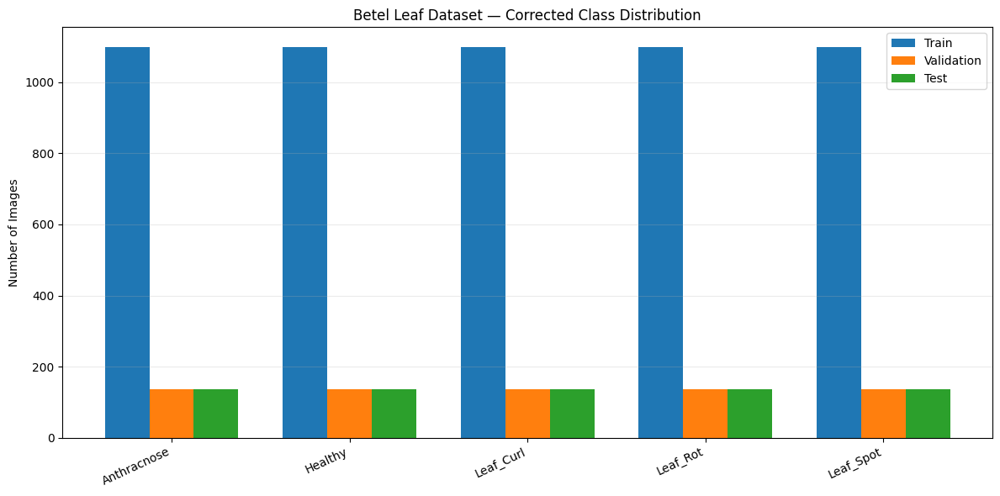

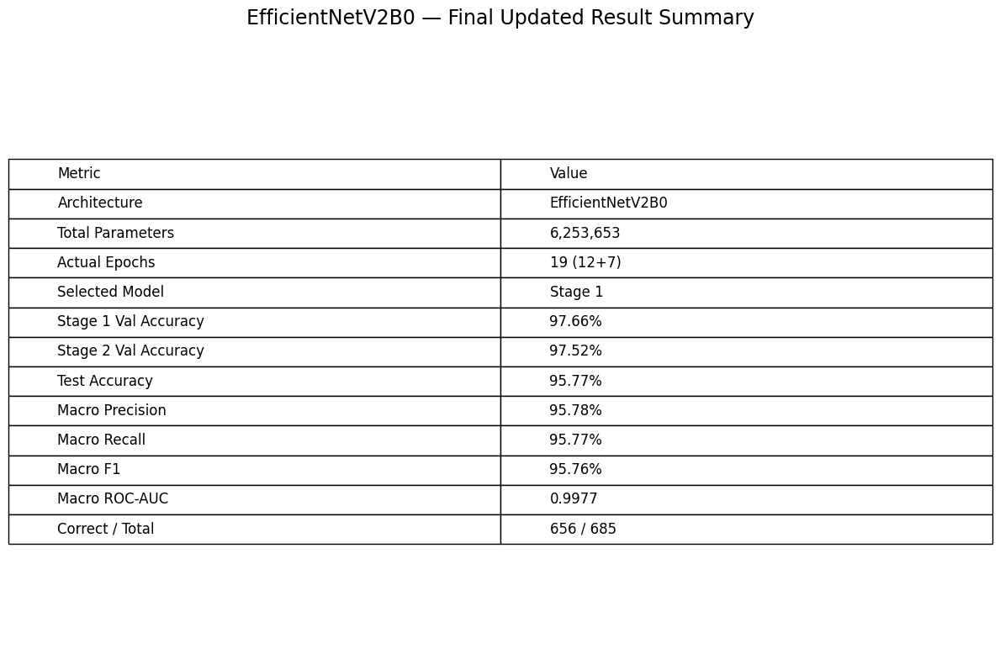

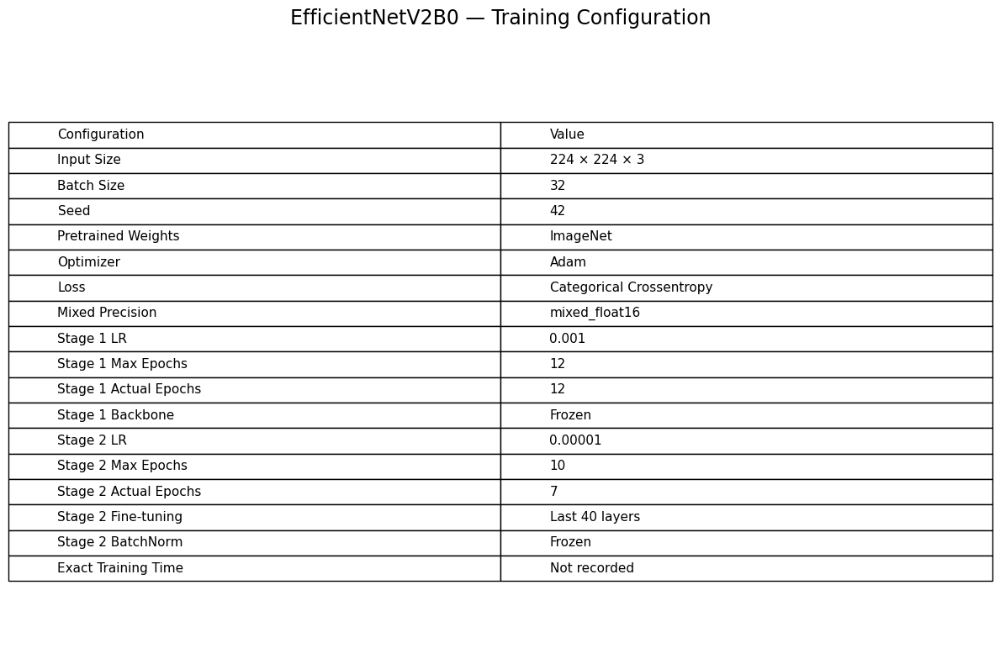


✅ FINAL UPDATED PACKAGE COMPLETED

📊 VERIFIED CORE RESULTS
Dataset      : 5500 / 685 / 685
Actual Epochs: 12 + 7 = 19
Parameters   : 6,253,653
Test Accuracy: 95.77%
Macro F1     : 95.76%
Macro ROC-AUC: 0.9977

📁 UPDATED FOLDER:
/kaggle/working/EfficientNetV2_UPDATED_FINAL_PACKAGE

🖼️ PNG FILES:
22
✓ classwise_precision_recall_f1.png
✓ confusion_matrix.png
✓ correct_vs_incorrect_confidence.png
✓ dataset_class_distribution.png
✓ final_result_summary.png
✓ gradcam_correct_predictions.png
✓ gradcam_misclassified_predictions.png
✓ learning_rate_history.png
✓ misclassified_samples_grid.png
✓ model_architecture.png
✓ model_parameter_summary.png
✓ normalized_confusion_matrix.png
✓ per_class_recall.png
✓ per_class_roc_auc.png
✓ precision_recall_curve.png
✓ prediction_confidence_distribution.png
✓ roc_curve.png
✓ sample_images_per_class.png
✓ stage1_vs_stage2_validation_accuracy.png
✓ training_configuration_summary.png
✓ training_validation_accuracy.png
✓ training_validation_loss.png

📄 RESULT 

In [9]:
# ======================================================================
# FINAL ONE-CELL CORRECTION + CLEAN UPDATED PACKAGE
# EfficientNetV2B0 — Betel Leaf Disease Classification
#
# NO RETRAINING
# NO FINE-TUNING
# NO TEST PREDICTION AGAIN
# ======================================================================

import os
import shutil
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf


# ======================================================================
# 1. EXISTING PATHS
# ======================================================================

DATASET_ROOT = Path(
    "/kaggle/input/datasets/"
    "efrathhossainshihab/"
    "betel-leaf-dataset-split/"
    "Betel_Leaf_DataSet_Split"
)

TRAIN_DIR = DATASET_ROOT / "train_augmented_1100"
VAL_DIR   = DATASET_ROOT / "validation"
TEST_DIR  = DATASET_ROOT / "test"

OLD_ROOT = Path("/kaggle/working/EfficientNetV2")

OLD_FINAL_RESULTS = OLD_ROOT / "Final_Results"
OLD_EXTRA_RESULTS = OLD_ROOT / "Additional_Analysis"

STAGE1_MODEL_PATH = (
    OLD_ROOT / "efficientnetv2_stage1_best.keras"
)

STAGE2_MODEL_PATH = (
    OLD_ROOT / "efficientnetv2_stage2_best.keras"
)

STAGE1_LOG_PATH = (
    OLD_ROOT / "efficientnetv2_stage1_log.csv"
)

STAGE2_LOG_PATH = (
    OLD_ROOT / "efficientnetv2_stage2_log.csv"
)


# ======================================================================
# 2. NEW CLEAN UPDATED PACKAGE
# ======================================================================

UPDATED_ROOT = Path(
    "/kaggle/working/"
    "EfficientNetV2_UPDATED_FINAL_PACKAGE"
)

MODEL_DIR   = UPDATED_ROOT / "Model"
RESULTS_DIR = UPDATED_ROOT / "Results"
PNG_DIR     = UPDATED_ROOT / "PNG"
LOG_DIR     = UPDATED_ROOT / "Logs"

# Remove an older corrected package if this cell is rerun
if UPDATED_ROOT.exists():
    shutil.rmtree(UPDATED_ROOT)

for folder in [
    MODEL_DIR,
    RESULTS_DIR,
    PNG_DIR,
    LOG_DIR
]:
    folder.mkdir(
        parents=True,
        exist_ok=True
    )

print("=" * 80)
print("EfficientNetV2B0 — FINAL PACKAGE CORRECTION")
print("=" * 80)


# ======================================================================
# 3. VERIFY REQUIRED FILES
# ======================================================================

required_paths = [
    TRAIN_DIR,
    VAL_DIR,
    TEST_DIR,
    OLD_FINAL_RESULTS,
    STAGE1_MODEL_PATH,
    STAGE1_LOG_PATH,
    STAGE2_LOG_PATH
]

for path in required_paths:
    if not path.exists():
        raise FileNotFoundError(
            f"Required path not found:\n{path}"
        )

print("✅ Required dataset/results verified.")


# ======================================================================
# 4. ROBUST CASE-INSENSITIVE IMAGE COUNTER
#
# Fixes .JPG / .JPEG / .PNG etc. counting issue
# ======================================================================

VALID_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp",
    ".tif",
    ".tiff"
}

CLASS_NAMES = [
    "Anthracnose",
    "Healthy",
    "Leaf_Curl",
    "Leaf_Rot",
    "Leaf_Spot"
]


def count_class_images(base_dir):

    counts = {}

    for class_name in CLASS_NAMES:

        class_dir = Path(base_dir) / class_name

        if not class_dir.exists():
            raise FileNotFoundError(
                f"Class folder missing: {class_dir}"
            )

        count = sum(
            1
            for file in class_dir.rglob("*")
            if (
                file.is_file()
                and
                file.suffix.lower()
                in VALID_EXTENSIONS
            )
        )

        counts[class_name] = count

    return counts


train_counts = count_class_images(
    TRAIN_DIR
)

val_counts = count_class_images(
    VAL_DIR
)

test_counts = count_class_images(
    TEST_DIR
)

TRAIN_TOTAL = sum(
    train_counts.values()
)

VAL_TOTAL = sum(
    val_counts.values()
)

TEST_TOTAL = sum(
    test_counts.values()
)


print("\n" + "=" * 80)
print("CORRECTED DATASET COUNTS")
print("=" * 80)

for cls in CLASS_NAMES:

    print(
        f"{cls:<15} | "
        f"Train: {train_counts[cls]:4d} | "
        f"Val: {val_counts[cls]:3d} | "
        f"Test: {test_counts[cls]:3d}"
    )

print("-" * 80)

print("Training Total   :", TRAIN_TOTAL)
print("Validation Total :", VAL_TOTAL)
print("Test Total       :", TEST_TOTAL)


EXPECTED = {
    "train": 5500,
    "val": 685,
    "test": 685
}

if (
    TRAIN_TOTAL == EXPECTED["train"]
    and
    VAL_TOTAL == EXPECTED["val"]
    and
    TEST_TOTAL == EXPECTED["test"]
):
    print("\n✅ Dataset count correction verified.")
else:
    print(
        "\n⚠️ Dataset totals differ from the "
        "previously verified experiment."
    )
    print(
        "The updated package will use the "
        "actual files detected now."
    )


# ======================================================================
# 5. LOAD TRAINING LOGS
# ======================================================================

stage1_df = pd.read_csv(
    STAGE1_LOG_PATH
)

stage2_df = pd.read_csv(
    STAGE2_LOG_PATH
)

STAGE1_ACTUAL_EPOCHS = len(
    stage1_df
)

STAGE2_ACTUAL_EPOCHS = len(
    stage2_df
)

TOTAL_ACTUAL_EPOCHS = (
    STAGE1_ACTUAL_EPOCHS
    +
    STAGE2_ACTUAL_EPOCHS
)


# ======================================================================
# 6. FIND EXACT VAL-ACCURACY SELECTED CHECKPOINT ROWS
# ======================================================================

s1_best_idx = stage1_df[
    "val_accuracy"
].idxmax()

s2_best_idx = stage2_df[
    "val_accuracy"
].idxmax()

STAGE1_SELECTED_VAL_ACC = float(
    stage1_df.loc[
        s1_best_idx,
        "val_accuracy"
    ]
)

STAGE1_SELECTED_VAL_LOSS = float(
    stage1_df.loc[
        s1_best_idx,
        "val_loss"
    ]
)

STAGE2_SELECTED_VAL_ACC = float(
    stage2_df.loc[
        s2_best_idx,
        "val_accuracy"
    ]
)

STAGE2_SELECTED_VAL_LOSS = float(
    stage2_df.loc[
        s2_best_idx,
        "val_loss"
    ]
)

STAGE1_MIN_VAL_LOSS = float(
    stage1_df["val_loss"].min()
)

STAGE2_MIN_VAL_LOSS = float(
    stage2_df["val_loss"].min()
)


print("\n" + "=" * 80)
print("ACTUAL TRAINING / CHECKPOINT INFORMATION")
print("=" * 80)

print(
    "Stage 1 Actual Epochs :",
    STAGE1_ACTUAL_EPOCHS
)

print(
    "Stage 2 Actual Epochs :",
    STAGE2_ACTUAL_EPOCHS
)

print(
    "Total Actual Epochs   :",
    TOTAL_ACTUAL_EPOCHS
)

print(
    "\nStage 1 Selected Val Accuracy : "
    f"{STAGE1_SELECTED_VAL_ACC*100:.2f}%"
)

print(
    "Stage 1 Selected Val Loss     : "
    f"{STAGE1_SELECTED_VAL_LOSS:.4f}"
)

print(
    "\nStage 2 Selected Val Accuracy : "
    f"{STAGE2_SELECTED_VAL_ACC*100:.2f}%"
)

print(
    "Stage 2 Selected Val Loss     : "
    f"{STAGE2_SELECTED_VAL_LOSS:.4f}"
)

print(
    "\nStage 1 Minimum Observed Loss : "
    f"{STAGE1_MIN_VAL_LOSS:.4f}"
)

print(
    "Stage 2 Minimum Observed Loss : "
    f"{STAGE2_MIN_VAL_LOSS:.4f}"
)


# ======================================================================
# 7. LOAD SELECTED STAGE-1 MODEL
# ======================================================================

final_model = tf.keras.models.load_model(
    STAGE1_MODEL_PATH,
    compile=False
)

TOTAL_PARAMS = int(
    final_model.count_params()
)

TRAINABLE_PARAMS = int(
    sum(
        np.prod(w.shape)
        for w
        in final_model.trainable_weights
    )
)

NON_TRAINABLE_PARAMS = int(
    sum(
        np.prod(w.shape)
        for w
        in final_model.non_trainable_weights
    )
)


print("\n" + "=" * 80)
print("MODEL PARAMETERS")
print("=" * 80)

print(
    f"Total Parameters         : "
    f"{TOTAL_PARAMS:,}"
)

print(
    f"Stage-1 Trainable        : "
    f"{TRAINABLE_PARAMS:,}"
)

print(
    f"Stage-1 Non-Trainable    : "
    f"{NON_TRAINABLE_PARAMS:,}"
)


# ======================================================================
# 8. LOAD EXISTING FINAL TEST METRICS
#
# We DO NOT rerun test evaluation.
# ======================================================================

old_metrics_path = (
    OLD_FINAL_RESULTS /
    "final_metrics.csv"
)

if not old_metrics_path.exists():
    raise FileNotFoundError(
        f"Missing final metrics:\n"
        f"{old_metrics_path}"
    )

old_metrics = pd.read_csv(
    old_metrics_path
).iloc[0]


TEST_LOSS = float(
    old_metrics["Test_Loss"]
)

TEST_ACCURACY = float(
    old_metrics["Test_Accuracy"]
)

PRECISION_MACRO = float(
    old_metrics["Precision_Macro"]
)

RECALL_MACRO = float(
    old_metrics["Recall_Macro"]
)

F1_MACRO = float(
    old_metrics["F1_Macro"]
)

ROC_AUC_MACRO = float(
    old_metrics["ROC_AUC_Macro"]
)

PRECISION_WEIGHTED = float(
    old_metrics["Precision_Weighted"]
)

RECALL_WEIGHTED = float(
    old_metrics["Recall_Weighted"]
)

F1_WEIGHTED = float(
    old_metrics["F1_Weighted"]
)

ROC_AUC_WEIGHTED = float(
    old_metrics["ROC_AUC_Weighted"]
)


# ======================================================================
# 9. LOAD CLASSWISE RESULTS
# ======================================================================

classification_csv = (
    OLD_FINAL_RESULTS /
    "classification_report.csv"
)

classification_df = pd.read_csv(
    classification_csv,
    index_col=0
)

class_rows = []

for cls in CLASS_NAMES:

    row = classification_df.loc[
        cls
    ]

    class_rows.append(
        {
            "Class": cls,
            "Precision": float(
                row["precision"]
            ),
            "Recall": float(
                row["recall"]
            ),
            "F1_Score": float(
                row["f1-score"]
            ),
            "Support": int(
                row["support"]
            )
        }
    )

final_classwise_df = pd.DataFrame(
    class_rows
)


# ======================================================================
# 10. ADD CLASS-WISE ROC-AUC FROM EXISTING FILE
# ======================================================================

roc_pr_path = (
    OLD_FINAL_RESULTS /
    "classwise_roc_pr_metrics.csv"
)

if roc_pr_path.exists():

    roc_pr_df = pd.read_csv(
        roc_pr_path
    )

    final_classwise_df = (
        final_classwise_df.merge(
            roc_pr_df[
                [
                    "Class",
                    "ROC_AUC",
                    "Average_Precision"
                ]
            ],
            on="Class",
            how="left"
        )
    )


# ======================================================================
# 11. CORRECTED DATASET DISTRIBUTION PNG
# ======================================================================

x = np.arange(
    len(CLASS_NAMES)
)

width = 0.25

plt.figure(
    figsize=(12, 6)
)

plt.bar(
    x - width,
    [
        train_counts[c]
        for c in CLASS_NAMES
    ],
    width,
    label="Train"
)

plt.bar(
    x,
    [
        val_counts[c]
        for c in CLASS_NAMES
    ],
    width,
    label="Validation"
)

plt.bar(
    x + width,
    [
        test_counts[c]
        for c in CLASS_NAMES
    ],
    width,
    label="Test"
)

plt.xticks(
    x,
    CLASS_NAMES,
    rotation=25,
    ha="right"
)

plt.ylabel(
    "Number of Images"
)

plt.title(
    "Betel Leaf Dataset — Corrected Class Distribution"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    PNG_DIR /
    "dataset_class_distribution.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()


# ======================================================================
# 12. NEW FINAL RESULT SUMMARY PNG
# ======================================================================

fig = plt.figure(
    figsize=(12, 8)
)

plt.axis(
    "off"
)

summary_rows = [
    [
        "Architecture",
        "EfficientNetV2B0"
    ],
    [
        "Total Parameters",
        f"{TOTAL_PARAMS:,}"
    ],
    [
        "Actual Epochs",
        f"{TOTAL_ACTUAL_EPOCHS} "
        f"({STAGE1_ACTUAL_EPOCHS}+"
        f"{STAGE2_ACTUAL_EPOCHS})"
    ],
    [
        "Selected Model",
        "Stage 1"
    ],
    [
        "Stage 1 Val Accuracy",
        f"{STAGE1_SELECTED_VAL_ACC*100:.2f}%"
    ],
    [
        "Stage 2 Val Accuracy",
        f"{STAGE2_SELECTED_VAL_ACC*100:.2f}%"
    ],
    [
        "Test Accuracy",
        f"{TEST_ACCURACY*100:.2f}%"
    ],
    [
        "Macro Precision",
        f"{PRECISION_MACRO*100:.2f}%"
    ],
    [
        "Macro Recall",
        f"{RECALL_MACRO*100:.2f}%"
    ],
    [
        "Macro F1",
        f"{F1_MACRO*100:.2f}%"
    ],
    [
        "Macro ROC-AUC",
        f"{ROC_AUC_MACRO:.4f}"
    ],
    [
        "Correct / Total",
        f"{round(TEST_ACCURACY*TEST_TOTAL)} "
        f"/ {TEST_TOTAL}"
    ]
]

table = plt.table(
    cellText=summary_rows,
    colLabels=[
        "Metric",
        "Value"
    ],
    cellLoc="left",
    colLoc="left",
    loc="center"
)

table.auto_set_font_size(
    False
)

table.set_fontsize(
    12
)

table.scale(
    1,
    1.8
)

plt.title(
    "EfficientNetV2B0 — Final Updated Result Summary",
    fontsize=17,
    pad=20
)

plt.tight_layout()

plt.savefig(
    PNG_DIR /
    "final_result_summary.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()


# ======================================================================
# 13. TRAINING CONFIGURATION SUMMARY PNG
# ======================================================================

fig = plt.figure(
    figsize=(12, 8)
)

plt.axis(
    "off"
)

config_rows = [
    ["Input Size", "224 × 224 × 3"],
    ["Batch Size", "32"],
    ["Seed", "42"],
    ["Pretrained Weights", "ImageNet"],
    ["Optimizer", "Adam"],
    ["Loss", "Categorical Crossentropy"],
    ["Mixed Precision", "mixed_float16"],
    ["Stage 1 LR", "0.001"],
    ["Stage 1 Max Epochs", "12"],
    [
        "Stage 1 Actual Epochs",
        str(STAGE1_ACTUAL_EPOCHS)
    ],
    [
        "Stage 1 Backbone",
        "Frozen"
    ],
    ["Stage 2 LR", "0.00001"],
    ["Stage 2 Max Epochs", "10"],
    [
        "Stage 2 Actual Epochs",
        str(STAGE2_ACTUAL_EPOCHS)
    ],
    [
        "Stage 2 Fine-tuning",
        "Last 40 layers"
    ],
    [
        "Stage 2 BatchNorm",
        "Frozen"
    ],
    [
        "Exact Training Time",
        "Not recorded"
    ]
]

table = plt.table(
    cellText=config_rows,
    colLabels=[
        "Configuration",
        "Value"
    ],
    cellLoc="left",
    colLoc="left",
    loc="center"
)

table.auto_set_font_size(
    False
)

table.set_fontsize(
    11
)

table.scale(
    1,
    1.55
)

plt.title(
    "EfficientNetV2B0 — Training Configuration",
    fontsize=17,
    pad=20
)

plt.tight_layout()

plt.savefig(
    PNG_DIR /
    "training_configuration_summary.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()


# ======================================================================
# 14. COPY ALL VALID EXISTING PNG FILES
#
# Skip old dataset distribution because corrected one already exists.
# ======================================================================

SKIP_PNG = {
    "dataset_class_distribution.png"
}

png_sources = [
    OLD_FINAL_RESULTS,
    OLD_EXTRA_RESULTS
]

copied_pngs = []

for source_dir in png_sources:

    if not source_dir.exists():
        continue

    for png_file in source_dir.glob(
        "*.png"
    ):

        if png_file.name in SKIP_PNG:
            continue

        destination = (
            PNG_DIR /
            png_file.name
        )

        shutil.copy2(
            png_file,
            destination
        )

        copied_pngs.append(
            png_file.name
        )


# ======================================================================
# 15. COPY IMPORTANT EXISTING RESULT FILES
# ======================================================================

important_result_files = [
    "classification_report.csv",
    "classification_report.txt",
    "classwise_metrics.csv",
    "classwise_roc_pr_metrics.csv",
    "test_predictions.csv",
    "misclassified_predictions.csv"
]

for filename in important_result_files:

    source = (
        OLD_FINAL_RESULTS /
        filename
    )

    if source.exists():

        shutil.copy2(
            source,
            RESULTS_DIR /
            filename
        )


# ======================================================================
# 16. COPY TRAINING LOGS
# ======================================================================

shutil.copy2(
    STAGE1_LOG_PATH,
    LOG_DIR /
    "stage1_training_log.csv"
)

shutil.copy2(
    STAGE2_LOG_PATH,
    LOG_DIR /
    "stage2_finetuning_log.csv"
)


# ======================================================================
# 17. COPY FINAL SELECTED MODEL
# ======================================================================

FINAL_MODEL_DESTINATION = (
    MODEL_DIR /
    "EfficientNetV2B0_Final_Selected_Stage1.keras"
)

shutil.copy2(
    STAGE1_MODEL_PATH,
    FINAL_MODEL_DESTINATION
)


# ======================================================================
# 18. CREATE FINAL UPDATED METRICS CSV
# ======================================================================

correct_predictions = int(
    round(
        TEST_ACCURACY *
        TEST_TOTAL
    )
)

misclassified_predictions = (
    TEST_TOTAL -
    correct_predictions
)

updated_metrics = pd.DataFrame(
    [
        {
            "Model":
                "EfficientNetV2B0",

            "Selected_Model":
                "Stage 1",

            "Train_Images":
                TRAIN_TOTAL,

            "Validation_Images":
                VAL_TOTAL,

            "Test_Images":
                TEST_TOTAL,

            "Total_Parameters":
                TOTAL_PARAMS,

            "Stage1_Trainable_Parameters":
                TRAINABLE_PARAMS,

            "Stage1_NonTrainable_Parameters":
                NON_TRAINABLE_PARAMS,

            "Stage1_Actual_Epochs":
                STAGE1_ACTUAL_EPOCHS,

            "Stage2_Actual_Epochs":
                STAGE2_ACTUAL_EPOCHS,

            "Total_Actual_Epochs":
                TOTAL_ACTUAL_EPOCHS,

            "Stage1_Selected_Val_Accuracy":
                STAGE1_SELECTED_VAL_ACC,

            "Stage1_Selected_Val_Loss":
                STAGE1_SELECTED_VAL_LOSS,

            "Stage2_Selected_Val_Accuracy":
                STAGE2_SELECTED_VAL_ACC,

            "Stage2_Selected_Val_Loss":
                STAGE2_SELECTED_VAL_LOSS,

            "Stage1_Min_Observed_Val_Loss":
                STAGE1_MIN_VAL_LOSS,

            "Stage2_Min_Observed_Val_Loss":
                STAGE2_MIN_VAL_LOSS,

            "Test_Loss":
                TEST_LOSS,

            "Test_Accuracy":
                TEST_ACCURACY,

            "Precision_Macro":
                PRECISION_MACRO,

            "Recall_Macro":
                RECALL_MACRO,

            "F1_Macro":
                F1_MACRO,

            "ROC_AUC_Macro":
                ROC_AUC_MACRO,

            "Precision_Weighted":
                PRECISION_WEIGHTED,

            "Recall_Weighted":
                RECALL_WEIGHTED,

            "F1_Weighted":
                F1_WEIGHTED,

            "ROC_AUC_Weighted":
                ROC_AUC_WEIGHTED,

            "Correct_Predictions":
                correct_predictions,

            "Misclassified_Predictions":
                misclassified_predictions,

            "Exact_Training_Time":
                "Not recorded"
        }
    ]
)

updated_metrics.to_csv(
    RESULTS_DIR /
    "FINAL_UPDATED_METRICS.csv",
    index=False
)


# ======================================================================
# 19. HYPERPARAMETERS CSV
# ======================================================================

hyperparameters = pd.DataFrame(
    [
        ["Architecture", "EfficientNetV2B0"],
        ["Pretrained Weights", "ImageNet"],
        ["Input Size", "224x224x3"],
        ["Batch Size", 32],
        ["Seed", 42],
        ["Classes", 5],
        ["Optimizer", "Adam"],
        [
            "Loss",
            "Categorical Crossentropy"
        ],
        [
            "Output Activation",
            "Softmax"
        ],
        [
            "Mixed Precision",
            "mixed_float16"
        ],
        ["Stage 1 LR", 0.001],
        [
            "Stage 1 Max Epochs",
            12
        ],
        [
            "Stage 1 Actual Epochs",
            STAGE1_ACTUAL_EPOCHS
        ],
        [
            "Stage 1 Backbone",
            "Frozen"
        ],
        ["Stage 2 LR", 0.00001],
        [
            "Stage 2 Max Epochs",
            10
        ],
        [
            "Stage 2 Actual Epochs",
            STAGE2_ACTUAL_EPOCHS
        ],
        [
            "Stage 2 Fine-tuned Layers",
            40
        ],
        [
            "Stage 2 BatchNorm",
            "Frozen"
        ],
        [
            "Stage 1 EarlyStopping Patience",
            5
        ],
        [
            "Stage 2 EarlyStopping Patience",
            4
        ],
        [
            "ReduceLROnPlateau Factor",
            0.2
        ],
        [
            "ReduceLROnPlateau Patience",
            2
        ],
        [
            "Minimum LR",
            1e-7
        ],
        [
            "Exact Training Time",
            "Not recorded"
        ]
    ],
    columns=[
        "Parameter",
        "Value"
    ]
)

hyperparameters.to_csv(
    RESULTS_DIR /
    "FINAL_HYPERPARAMETERS.csv",
    index=False
)


# ======================================================================
# 20. SAVE CLASS-WISE FINAL RESULTS
# ======================================================================

final_classwise_df.to_csv(
    RESULTS_DIR /
    "FINAL_CLASSWISE_RESULTS.csv",
    index=False
)


# ======================================================================
# 21. SAVE CORRECT DATASET COUNTS
# ======================================================================

dataset_rows = []

for cls in CLASS_NAMES:

    dataset_rows.append(
        {
            "Class": cls,
            "Train": train_counts[cls],
            "Validation": val_counts[cls],
            "Test": test_counts[cls]
        }
    )

dataset_count_df = pd.DataFrame(
    dataset_rows
)

dataset_count_df.loc[
    len(dataset_count_df)
] = {
    "Class": "TOTAL",
    "Train": TRAIN_TOTAL,
    "Validation": VAL_TOTAL,
    "Test": TEST_TOTAL
}

dataset_count_df.to_csv(
    RESULTS_DIR /
    "FINAL_DATASET_COUNTS.csv",
    index=False
)


# ======================================================================
# 22. FINAL UPDATED SUMMARY TXT
# ======================================================================

final_summary = f"""
================================================================================
EfficientNetV2B0 — FINAL UPDATED EXPERIMENT SUMMARY
================================================================================

MODEL
--------------------------------------------------------------------------------
Architecture                  : EfficientNetV2B0
Pretrained Weights            : ImageNet
Input Size                    : 224 x 224 x 3
Batch Size                    : 32
Seed                          : 42
Number of Classes             : 5
Classes                       : {CLASS_NAMES}

MODEL PARAMETERS
--------------------------------------------------------------------------------
Total Parameters              : {TOTAL_PARAMS:,}
Stage-1 Trainable Parameters  : {TRAINABLE_PARAMS:,}
Stage-1 Non-Trainable Params  : {NON_TRAINABLE_PARAMS:,}

DATASET — CORRECTED AND VERIFIED
--------------------------------------------------------------------------------
Training Images               : {TRAIN_TOTAL}
Validation Images             : {VAL_TOTAL}
Test Images                   : {TEST_TOTAL}

Per-Class Training            : {train_counts}
Per-Class Validation          : {val_counts}
Per-Class Test                : {test_counts}

TRAINING STRATEGY
--------------------------------------------------------------------------------
Optimizer                     : Adam
Loss                          : Categorical Crossentropy
Mixed Precision               : mixed_float16

Stage 1
  Backbone                    : Frozen
  Initial Learning Rate       : 0.001
  Maximum Epochs              : 12
  Actual Epochs               : {STAGE1_ACTUAL_EPOCHS}
  Selected Val Accuracy       : {STAGE1_SELECTED_VAL_ACC*100:.2f}%
  Selected Val Loss           : {STAGE1_SELECTED_VAL_LOSS:.4f}
  Minimum Observed Val Loss   : {STAGE1_MIN_VAL_LOSS:.4f}

Stage 2
  Fine-Tuned Layers           : Last 40
  BatchNorm                   : Frozen
  Initial Learning Rate       : 0.00001
  Maximum Epochs              : 10
  Actual Epochs               : {STAGE2_ACTUAL_EPOCHS}
  Selected Val Accuracy       : {STAGE2_SELECTED_VAL_ACC*100:.2f}%
  Selected Val Loss           : {STAGE2_SELECTED_VAL_LOSS:.4f}
  Minimum Observed Val Loss   : {STAGE2_MIN_VAL_LOSS:.4f}

Total Actual Epochs           : {TOTAL_ACTUAL_EPOCHS}

FINAL MODEL SELECTION
--------------------------------------------------------------------------------
Selected Model                : Stage 1
Selection Metric              : Validation Accuracy

Reason:
Stage 1 achieved the higher validation accuracy and was therefore retained
as the final model. The test set was not used for model selection.

FINAL TEST RESULTS
--------------------------------------------------------------------------------
Test Loss                     : {TEST_LOSS:.4f}
Accuracy                      : {TEST_ACCURACY*100:.2f}%

Precision (Macro)             : {PRECISION_MACRO*100:.2f}%
Recall (Macro)                : {RECALL_MACRO*100:.2f}%
F1 Score (Macro)              : {F1_MACRO*100:.2f}%
ROC-AUC (Macro)               : {ROC_AUC_MACRO:.4f}

Precision (Weighted)          : {PRECISION_WEIGHTED*100:.2f}%
Recall (Weighted)             : {RECALL_WEIGHTED*100:.2f}%
F1 Score (Weighted)           : {F1_WEIGHTED*100:.2f}%
ROC-AUC (Weighted)            : {ROC_AUC_WEIGHTED:.4f}

Correct Predictions           : {correct_predictions}
Misclassified Predictions     : {misclassified_predictions}
Total Test Images             : {TEST_TOTAL}

TRAINING TIME
--------------------------------------------------------------------------------
Exact Stage-1/Stage-2 Training Time : NOT RECORDED

Original final notebook output recorded approximately:
Final Test Evaluation         : 44 seconds
Prediction                    : 43 seconds
Evaluation + Prediction       : approximately 87 seconds

IMPORTANT CORRECTIONS
--------------------------------------------------------------------------------
1. Previous additional-analysis dataset counts of 5497 training and
   683 validation images were caused by case-sensitive extension counting.

2. The corrected case-insensitive counts are:
   Train = {TRAIN_TOTAL}
   Validation = {VAL_TOTAL}
   Test = {TEST_TOTAL}

3. "Selected Validation Loss" means the loss from the checkpoint selected
   by maximum validation accuracy.

4. "Minimum Observed Validation Loss" is reported separately and must not
   be confused with the selected checkpoint loss.

5. Actual epochs were determined directly from saved CSV training logs.

================================================================================
"""

with open(
    RESULTS_DIR /
    "FINAL_UPDATED_SUMMARY.txt",
    "w"
) as file:

    file.write(
        final_summary
    )


# ======================================================================
# 23. UPDATE NOTES
# ======================================================================

update_notes = f"""
EfficientNetV2B0 — UPDATE NOTES
================================

This package supersedes the previous additional-analysis package.

CORRECTIONS APPLIED
-------------------
1. Dataset counting is now case-insensitive.
2. Training count corrected to {TRAIN_TOTAL}.
3. Validation count corrected to {VAL_TOTAL}.
4. Test count verified as {TEST_TOTAL}.
5. dataset_class_distribution.png regenerated.
6. Actual epochs read from saved logs:
   Stage 1 = {STAGE1_ACTUAL_EPOCHS}
   Stage 2 = {STAGE2_ACTUAL_EPOCHS}
   Total   = {TOTAL_ACTUAL_EPOCHS}
7. Selected-checkpoint validation loss is separated from minimum observed
   validation loss.
8. Parameter counts were read directly from the selected Stage-1 model.
9. No model retraining was performed.
10. No test prediction/evaluation was rerun.
11. Existing valid research figures were copied into the new PNG folder.
12. Exact model training time was not originally recorded and therefore
    has not been fabricated.

FINAL SELECTED MODEL
--------------------
Stage 1 EfficientNetV2B0

FINAL TEST ACCURACY
-------------------
{TEST_ACCURACY*100:.2f}%

FINAL MACRO F1
--------------
{F1_MACRO*100:.2f}%

FINAL MACRO ROC-AUC
-------------------
{ROC_AUC_MACRO:.4f}
"""

with open(
    UPDATED_ROOT /
    "UPDATE_NOTES.txt",
    "w"
) as file:

    file.write(
        update_notes
    )


# ======================================================================
# 24. CREATE MANIFEST
# ======================================================================

manifest_lines = [
    "EfficientNetV2B0 UPDATED FINAL PACKAGE",
    "=" * 60,
    ""
]

for root, dirs, files in os.walk(
    UPDATED_ROOT
):

    relative = os.path.relpath(
        root,
        UPDATED_ROOT
    )

    level = (
        0 if relative == "."
        else relative.count(os.sep) + 1
    )

    indent = "    " * level

    if relative == ".":
        manifest_lines.append(
            UPDATED_ROOT.name + "/"
        )
    else:
        manifest_lines.append(
            indent +
            Path(root).name +
            "/"
        )

    for filename in sorted(
        files
    ):

        manifest_lines.append(
            indent +
            "    " +
            filename
        )

with open(
    UPDATED_ROOT /
    "PACKAGE_MANIFEST.txt",
    "w"
) as file:

    file.write(
        "\n".join(
            manifest_lines
        )
    )


# ======================================================================
# 25. CREATE FINAL UPDATED ZIP
# ======================================================================

ZIP_BASE = (
    "/kaggle/working/"
    "EfficientNetV2_UPDATED_FINAL_PACKAGE"
)

ZIP_PATH = (
    ZIP_BASE + ".zip"
)

if os.path.exists(
    ZIP_PATH
):
    os.remove(
        ZIP_PATH
    )

shutil.make_archive(
    ZIP_BASE,
    "zip",
    root_dir="/kaggle/working",
    base_dir="EfficientNetV2_UPDATED_FINAL_PACKAGE"
)


# ======================================================================
# 26. FINAL AUDIT
# ======================================================================

all_pngs = sorted(
    PNG_DIR.glob(
        "*.png"
    )
)

all_results = sorted(
    RESULTS_DIR.iterdir()
)

all_logs = sorted(
    LOG_DIR.iterdir()
)

all_models = sorted(
    MODEL_DIR.iterdir()
)


print("\n" + "=" * 80)
print("✅ FINAL UPDATED PACKAGE COMPLETED")
print("=" * 80)

print("\n📊 VERIFIED CORE RESULTS")

print(
    f"Dataset      : "
    f"{TRAIN_TOTAL} / "
    f"{VAL_TOTAL} / "
    f"{TEST_TOTAL}"
)

print(
    f"Actual Epochs: "
    f"{STAGE1_ACTUAL_EPOCHS} + "
    f"{STAGE2_ACTUAL_EPOCHS} "
    f"= {TOTAL_ACTUAL_EPOCHS}"
)

print(
    f"Parameters   : "
    f"{TOTAL_PARAMS:,}"
)

print(
    f"Test Accuracy: "
    f"{TEST_ACCURACY*100:.2f}%"
)

print(
    f"Macro F1     : "
    f"{F1_MACRO*100:.2f}%"
)

print(
    f"Macro ROC-AUC: "
    f"{ROC_AUC_MACRO:.4f}"
)


print("\n📁 UPDATED FOLDER:")
print(
    UPDATED_ROOT
)

print("\n🖼️ PNG FILES:")
print(
    len(all_pngs)
)

for file in all_pngs:
    print(
        "✓",
        file.name
    )


print("\n📄 RESULT FILES:")
for file in all_results:
    print(
        "✓",
        file.name
    )


print("\n📈 LOG FILES:")
for file in all_logs:
    print(
        "✓",
        file.name
    )


print("\n🧠 MODEL FILE:")
for file in all_models:
    print(
        "✓",
        file.name
    )


print("\n📦 FINAL UPDATED ZIP:")
print(
    ZIP_PATH
)

print(
    "\n🎉 EfficientNetV2B0 experiment "
    "is now clean, corrected and finalized."
)

print(
    "\nDownload from Kaggle Output:"
)

print(
    "EfficientNetV2_UPDATED_FINAL_PACKAGE.zip"
)